In [2]:
import pandas as pd
import numpy as numpy
import matplotlib.pyplot as plt
import sys
sys.path.append('C:/Users/balay/Desktop/GL_method/Gregory-lorendo-Method')
from Oscilation_Detector import *
from Signalgenerator import *

In [10]:
generator1 = SignalGenerator(frequency=0.050, noise=0)
generator2 = SignalGenerator(frequency=0.060)
generator2.data.T[1] = generator2.data.T[1] + generator1.data.T[1]

pc = Oscilation_Detector(generator2.data, w_min=0.02, w_max=0.09)
pc.Compute_GL(resolution=1000, bins=9)
pc.Compute_GP(resolution=500)


pc.plot_data()
pc.Plot_FFT()
pc.Plot_GL()
pc.Plot_GP()
pc.Sample()


pc.fft_result
pc.GP_result
pc.GL_result


pc.GL

array([[  0.        ,   1.99342831,   2.        ],
       [  1.00200401,   4.71545537,   2.        ],
       [  2.00400802,   2.31140914,   2.        ],
       ...,
       [497.99599198,   0.63535471,   2.        ],
       [498.99799599,   3.24074746,   2.        ],
       [500.        ,  -1.76559946,   2.        ]])

c:\Users\balay\Anaconda3\envs\daml\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__periodicity is close to the specified upper bound 20.001. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
c:\Users\balay\Anaconda3\envs\daml\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__periodicity is close to the specified upper bound 20.151. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
c:\Users\balay\Anaconda3\envs\daml\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__periodicity is close to the specified lower bound 20.299999999999997. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
c:\Users\balay\Anaconda3\envs\daml\lib\site-pa

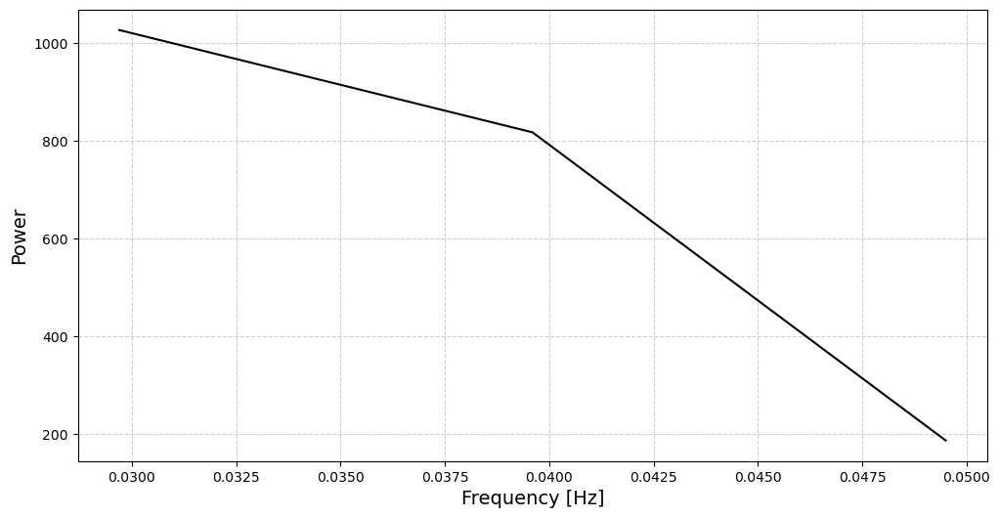

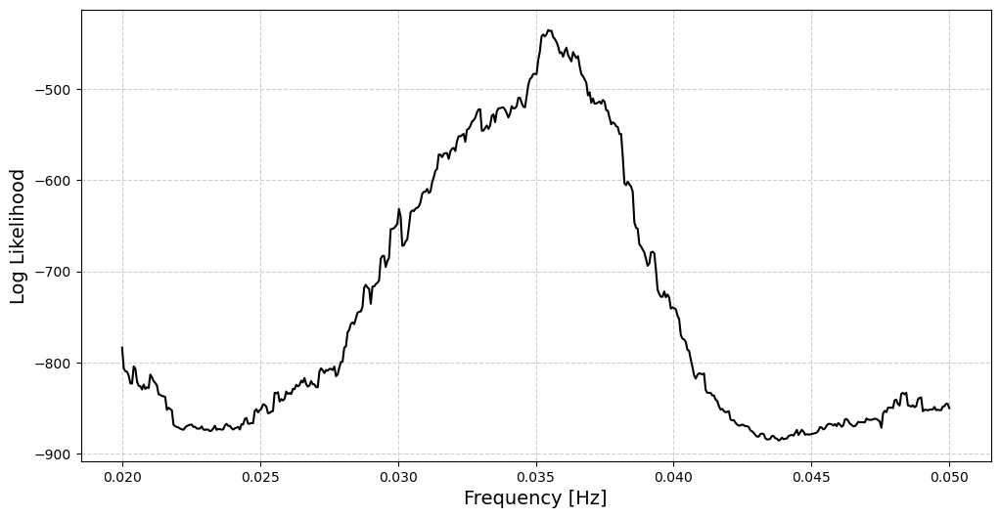

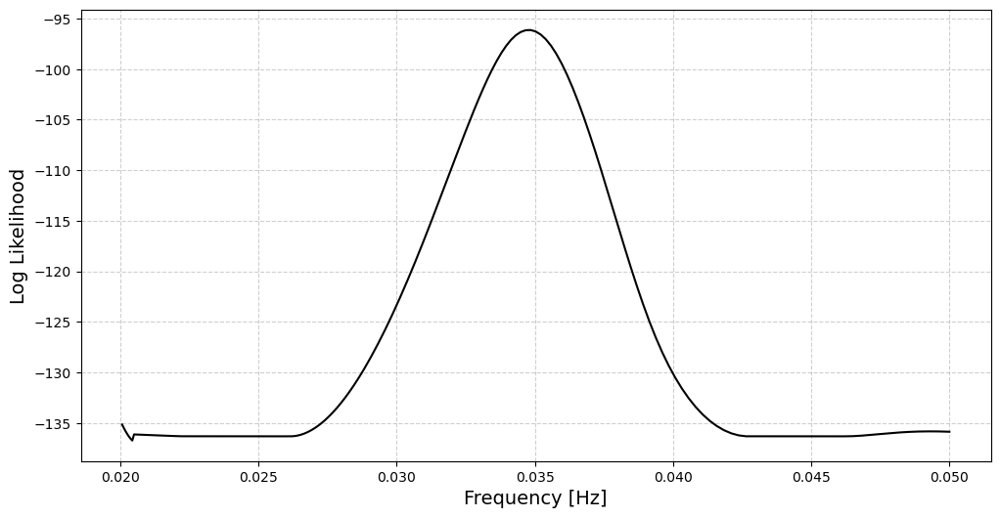

In [3]:
generator = SignalGenerator()
pc = Oscilation_Detector(generator.data, w_min=00.02, w_max=0.05)
pc.Compute_FFT()
pc.Compute_GL()
pc.Compute_GP()
pc.Plot_FFT()
pc.Plot_GL()
pc.Plot_GP()

# ploting Data

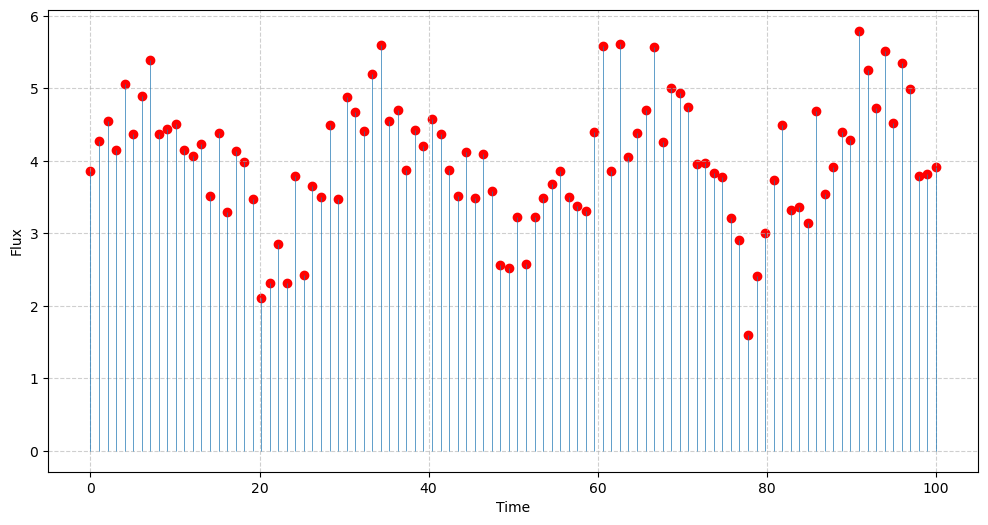

In [6]:
pc.plot_data()

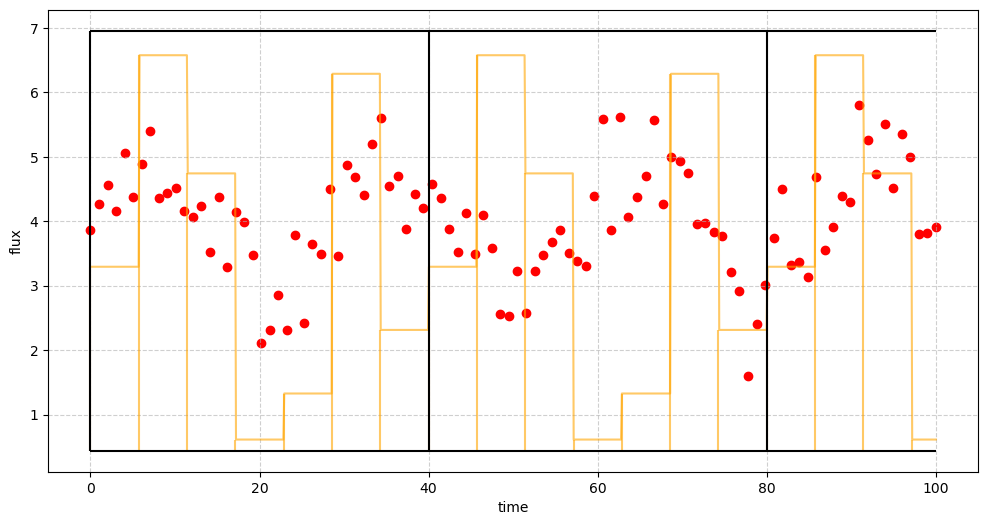

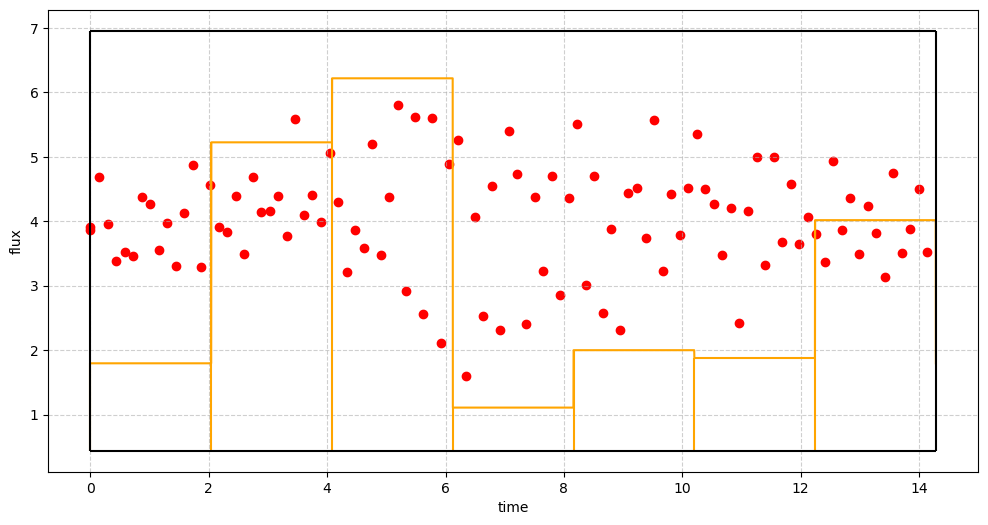

In [4]:
pc.Sample(frequency=0.025)
pc.Sample_bin()

In [22]:
    def _r( t, *r_values, w, phi, b):

        # Special Function to make r vector on demand, See Gregory Paper for r vector
        index = pc.j(t,w, phi, b) - 1  # Subtract 1 to match Python's 0-indexing
        return r_values[index]   

    def Sample( frequency = None, bins = None):

        if frequency is None:
            frequency = (pc.w_max + pc.w_min)
        if bins is None:
            bins = pc.m

        # Plotting Specified Model along with Data
        w = frequency
        phi = 0
        b = bins
        r_values = [4, 5, 5.5, 4, 4.2, 3.5, 2.5, 2.5, 3.5]
        fig = plt.figure(figsize=(12, 6))
        plt.plot(pc.time, [pc._r(time, *r_values, w = w , phi = phi, b = b) for time in pc.time], color='orange', alpha = 0.6)
        net_bins = (max(pc.data.T[0])*w*bins).astype(int)
        #verticle line for bins
        for i in range(net_bins+1):
            plt.vlines((i)*1/(w*bins), pc.rmin, r_values[np.mod(i, bins)], color='orange', alpha = 0.6)
        #Verticle line for first bin
        for i in range(net_bins//bins +1):
            plt.vlines(i/w, pc.rmin, pc.rmax , colors='black')
        #verticle lines to enclose periodic set of bins
        plt.hlines(pc.rmin, 0, max(pc.data.T[0]), colors='black')
        plt.hlines(pc.rmax, 0, max(pc.data.T[0]), colors='black')
        #plt.vlines(1/(w*bins), 0, r_values[1], colors='red')
        plt.scatter(pc.data[:, 0], pc.data[:, 1], color = 'red')
        plt.xlabel('time')
        plt.ylabel('flux')
        # Optional: Adding a grid for better readability
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.title('')
        plt.show()

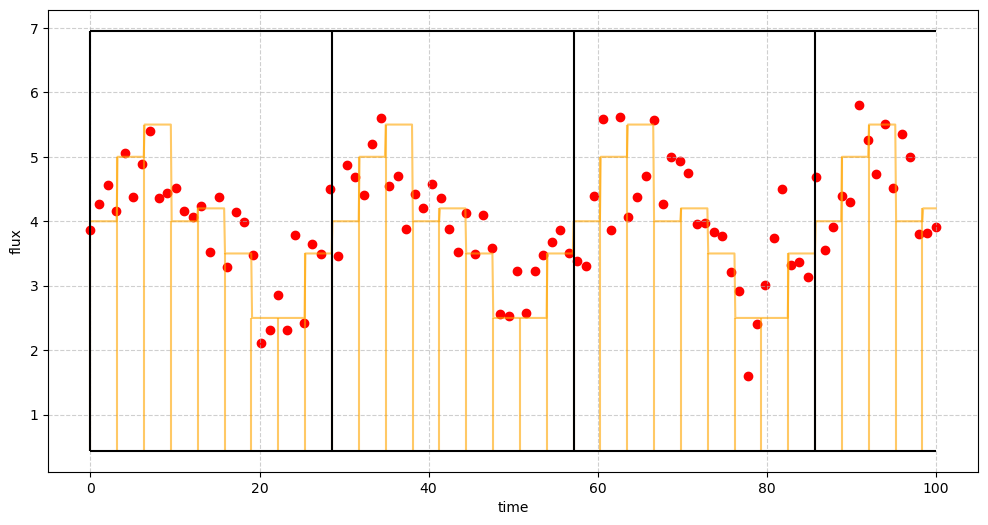

In [23]:
Sample(frequency=0.035, bins=9)

In [25]:
    def Sample_bin( frequency = None, bins = None ):

        if frequency is None:
            frequency = (pc.w_max + pc.w_min)
        if bins is None:
            bins = pc.m

        # Ploting with Similar Bins Overlayed (Model and Data)
        w = frequency
        phi = 0
        b = bins
        r_values = [4, 5, 5.5, 4, 4.2, 3.5, 2.5, 2.5, 3.5]
        fig = plt.figure(figsize=(12, 6))
        #time in first period
        first_period_time = np.linspace(0, 1/w, 5000)
        plt.plot(first_period_time, [pc._r(time, *r_values, w = w , phi = phi, b = b) for time in first_period_time], color='orange')
        net_bins = (max(pc.data.T[0])*w*bins).astype(int)
        #verticle line for bins
        for i in range(bins):
            plt.vlines((i)*1/(w*bins), pc.rmin, r_values[i], colors = 'orange')
        #Verticle line for first bin
        plt.vlines(0, pc.rmin , pc.rmax  , colors='black')
        plt.vlines(1/w , pc.rmin , pc.rmax , colors='black')
        #verticle lines to enclose periodic set of bins
        plt.hlines(pc.rmin, 0, 1/w, colors='black')
        plt.hlines(pc.rmax, 0, 1/w, colors='black')
        #plt.vlines(1/(w*bins), 0, r_values[1], colors='red')
        plt.scatter(np.mod(pc.data[:, 0], 1/w) , pc.data[:, 1], color = 'red')
        plt.xlabel('time')
        plt.ylabel('flux')
        # Optional: Adding a grid for better readability
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.title('')
        plt.show()

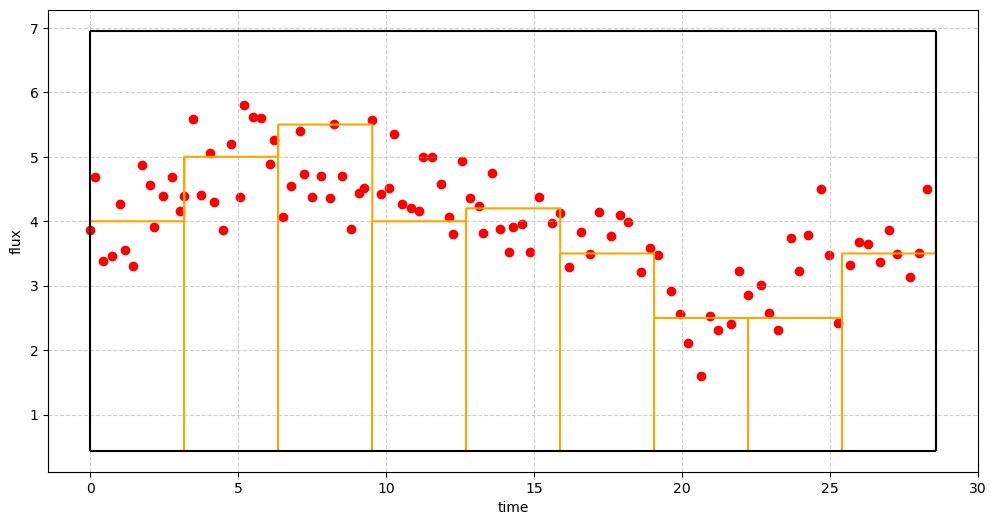

In [26]:
Sample_bin(frequency=0.035, bins=9)

# wraping polar Plot

C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:355: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r-" (-> color='r'). The keyword argument will take precedence.
  plt.plot([0, y*np.cos(x)], [0, y*np.sin(x)], 'r-', color = 'black')


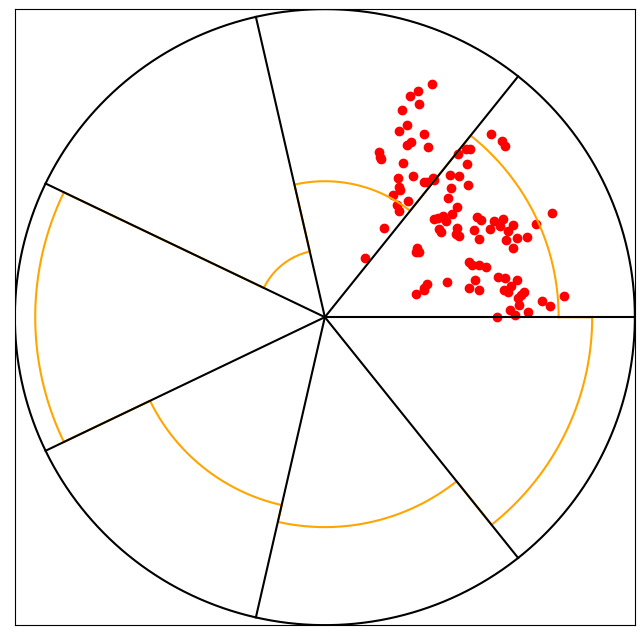

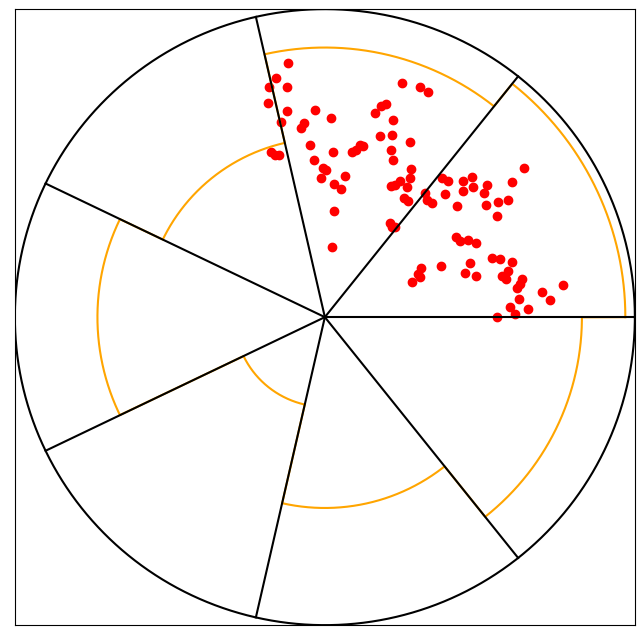

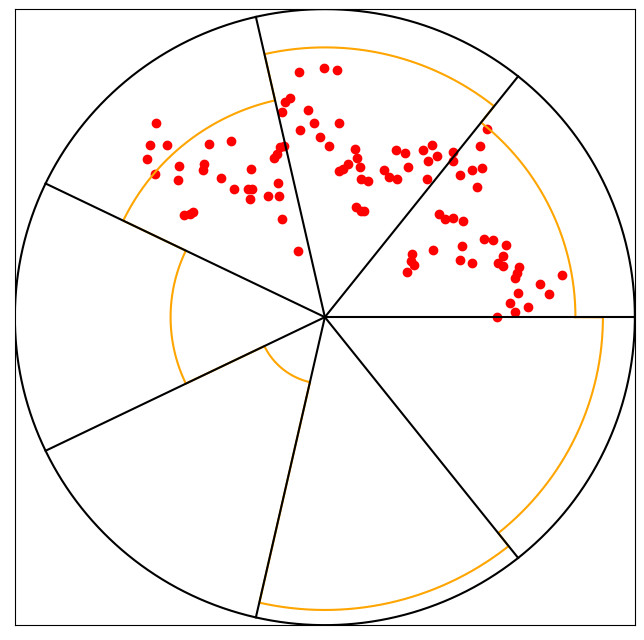

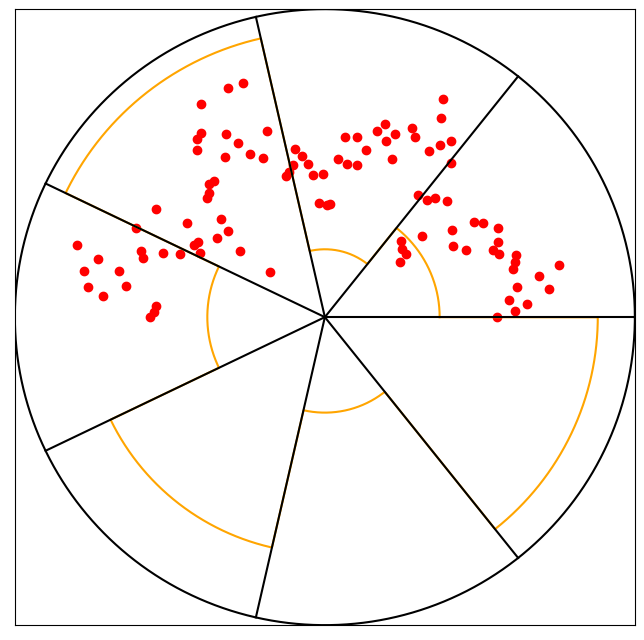

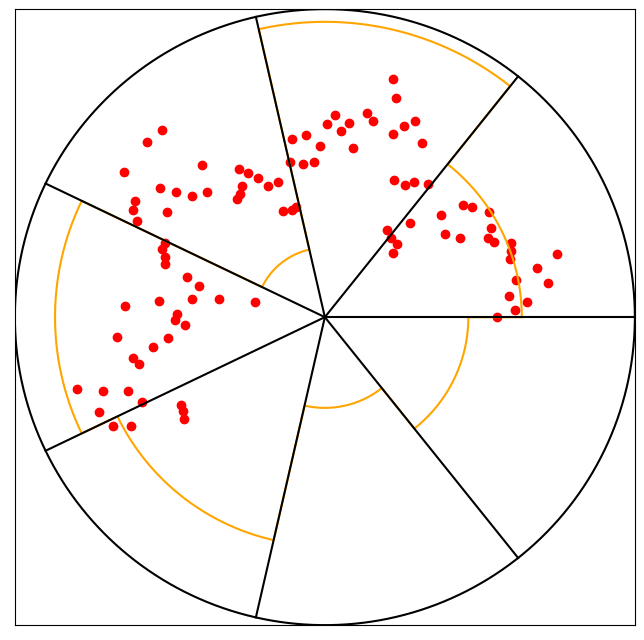

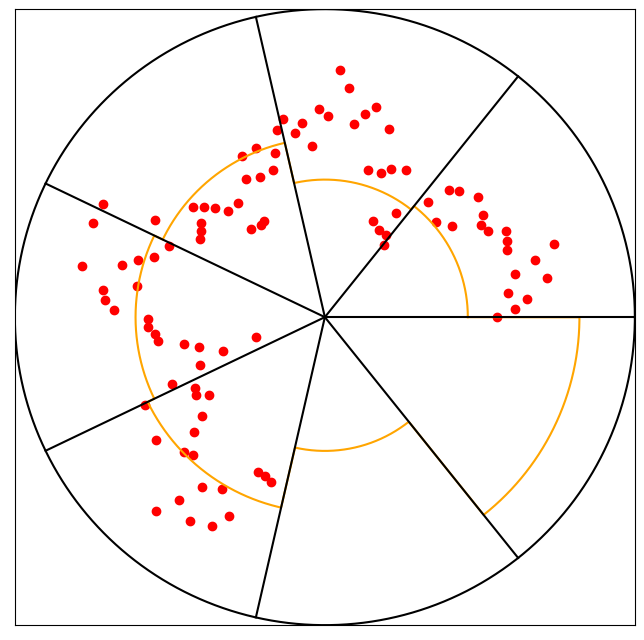

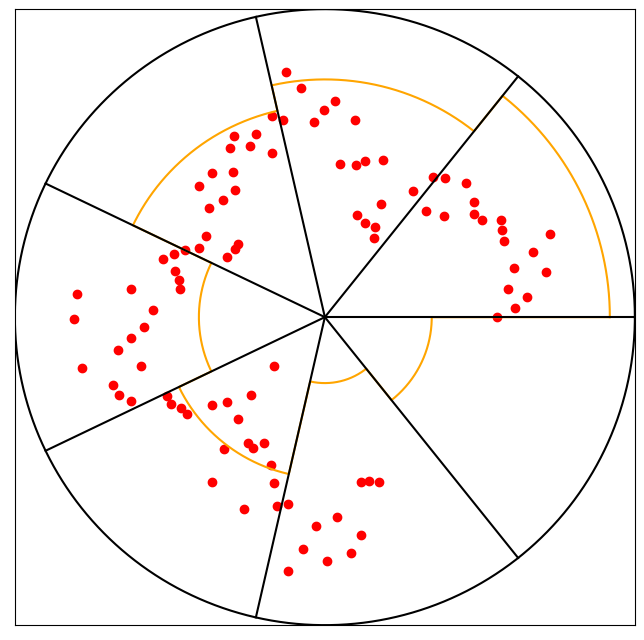

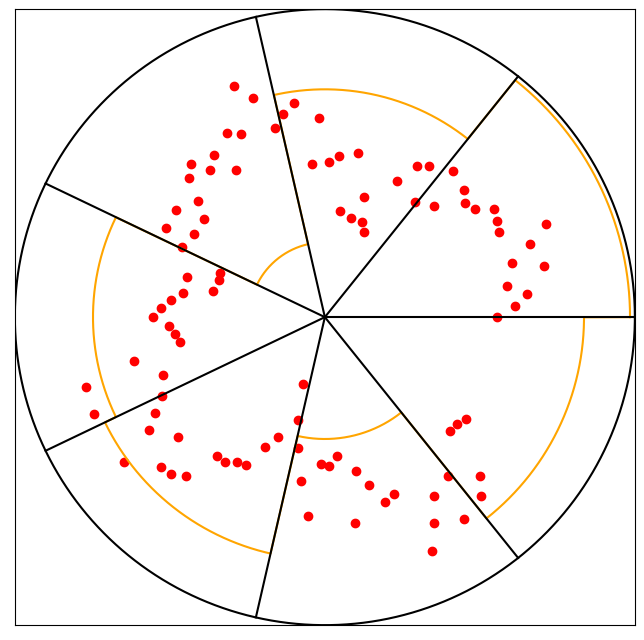

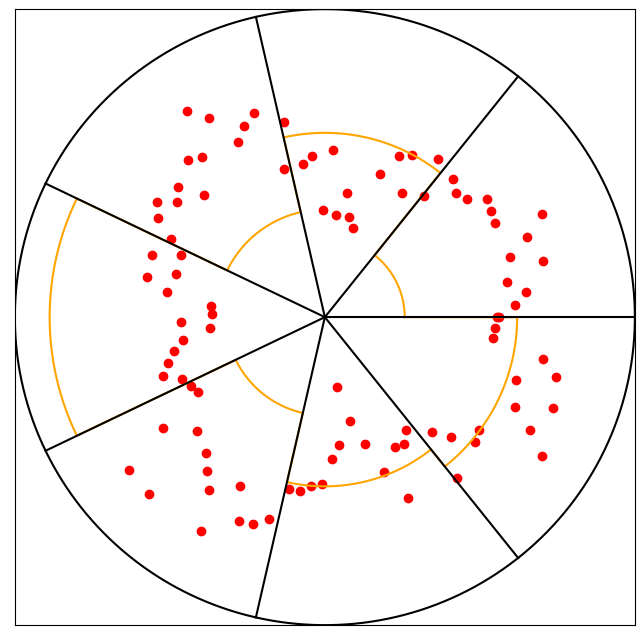

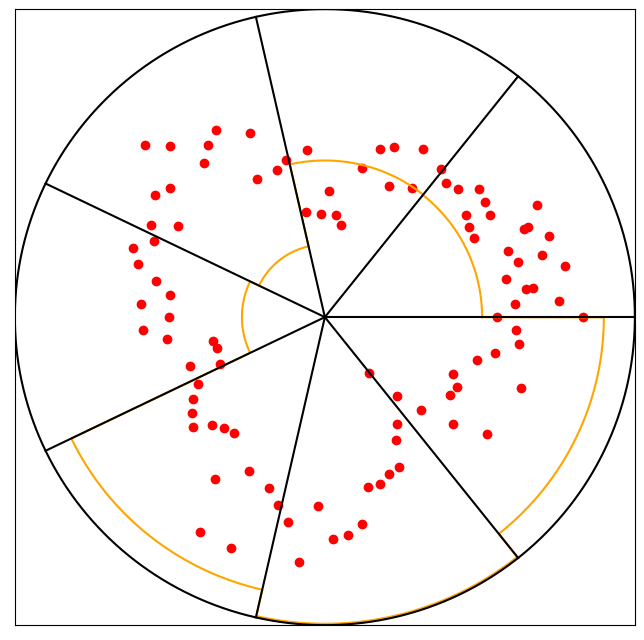

In [5]:
frequency = 0.002
for i in range(10):
    pc.Sample_polar(frequency=frequency)
    frequency +=0.001


# Generate sinosodial Signal

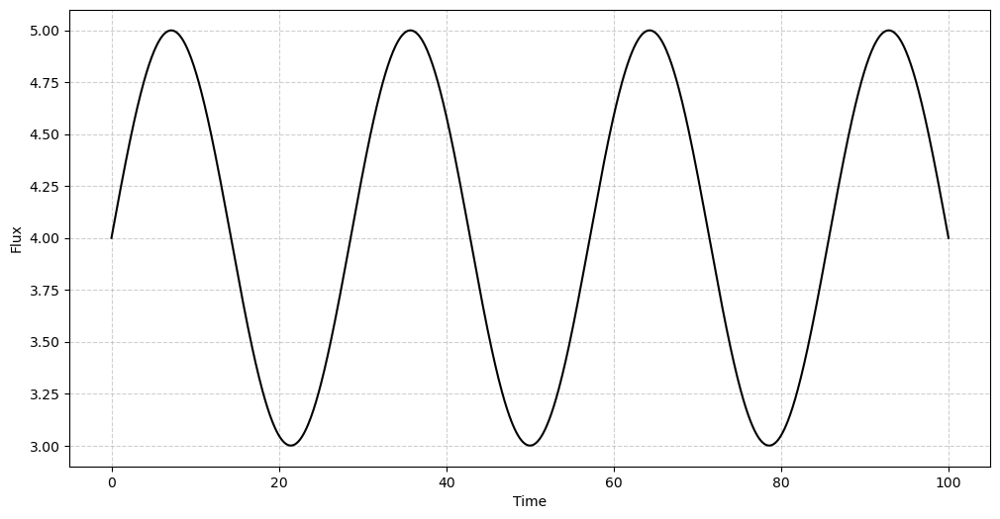

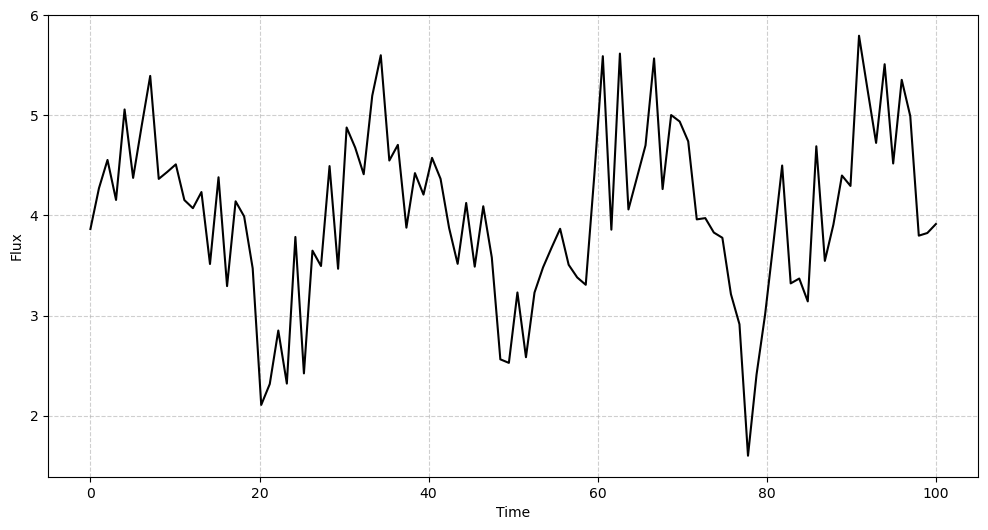

In [4]:
generator.generate_sine_signal()
generator.plot_pure_data()
generator.plot_noise_data()

# Generate Sawtooth Signal

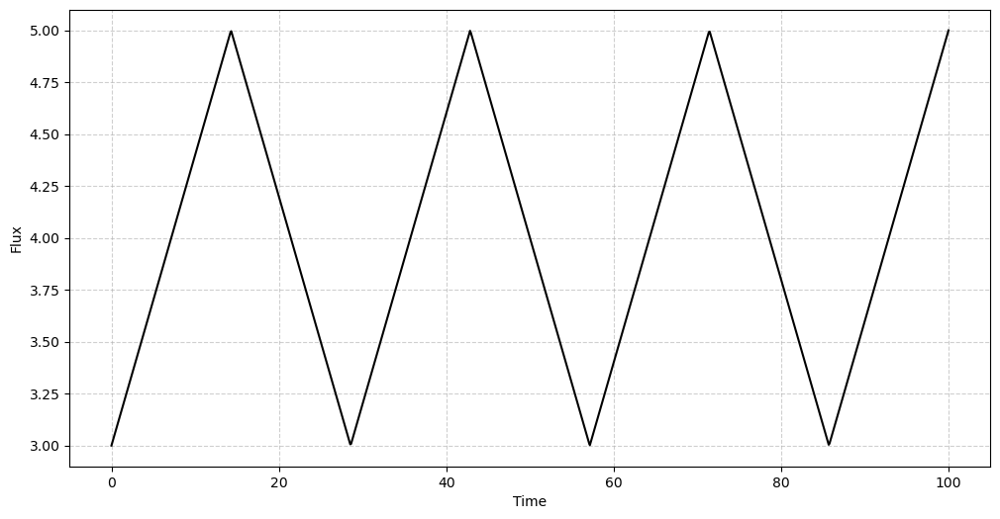

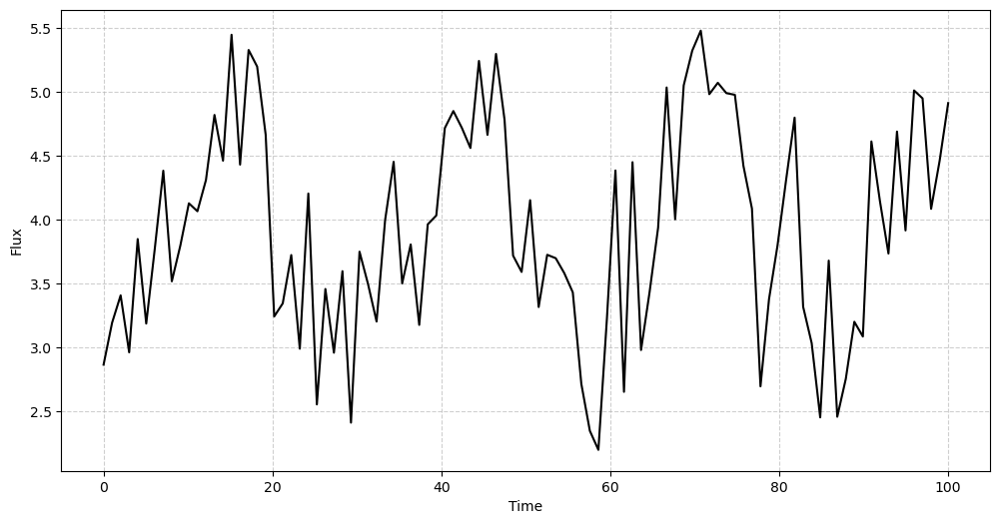

In [5]:
generator.generate_triangular_signal()
generator.plot_pure_data()
generator.plot_noise_data()

# Generate Action potential Signal

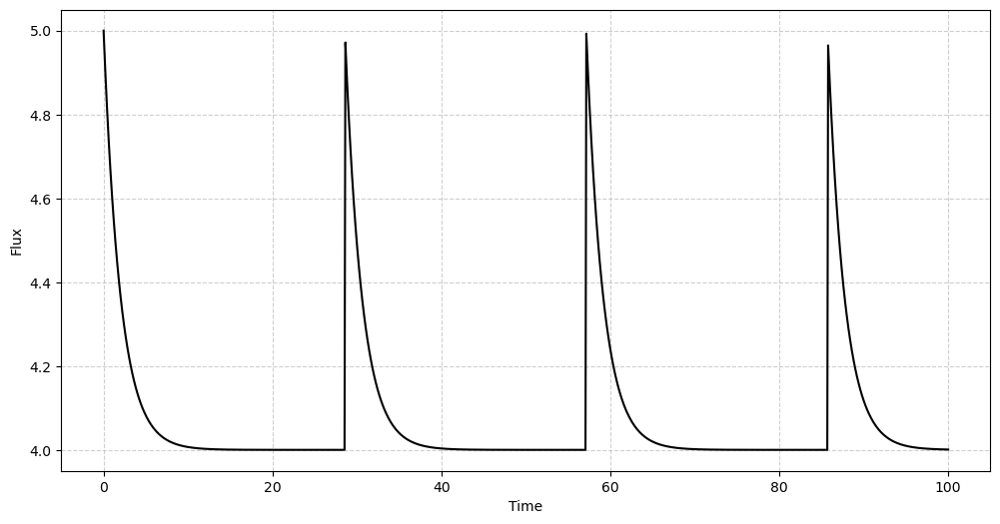

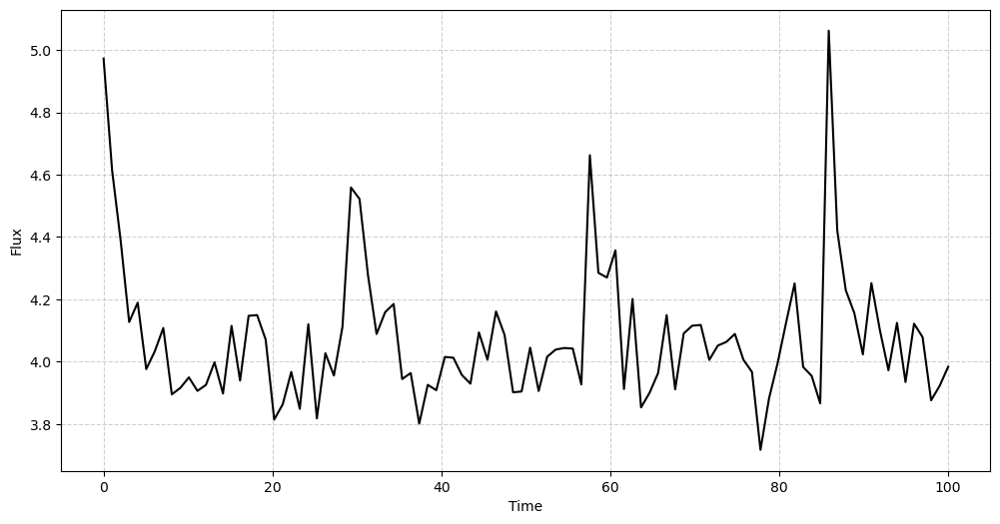

In [10]:
generator.noise = 0.1
generator.generate_impulsive_signal()
generator.plot_pure_data()
generator.plot_noise_data()

# Combination of Signal

In [80]:
generator1 = SignalGenerator(frequency=0.050, noise=0)
generator2 = SignalGenerator(frequency=0.060)
generator2.data.T[1] = generator2.data.T[1] + generator1.data.T[1]

c:\Users\balay\Anaconda3\envs\daml\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__periodicity is close to the specified upper bound 12.501. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
c:\Users\balay\Anaconda3\envs\daml\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__periodicity is close to the specified upper bound 12.605166666666666. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
c:\Users\balay\Anaconda3\envs\daml\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__periodicity is close to the specified upper bound 12.709333333333332. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
c:\Users\balay\Anaconda3\envs\daml

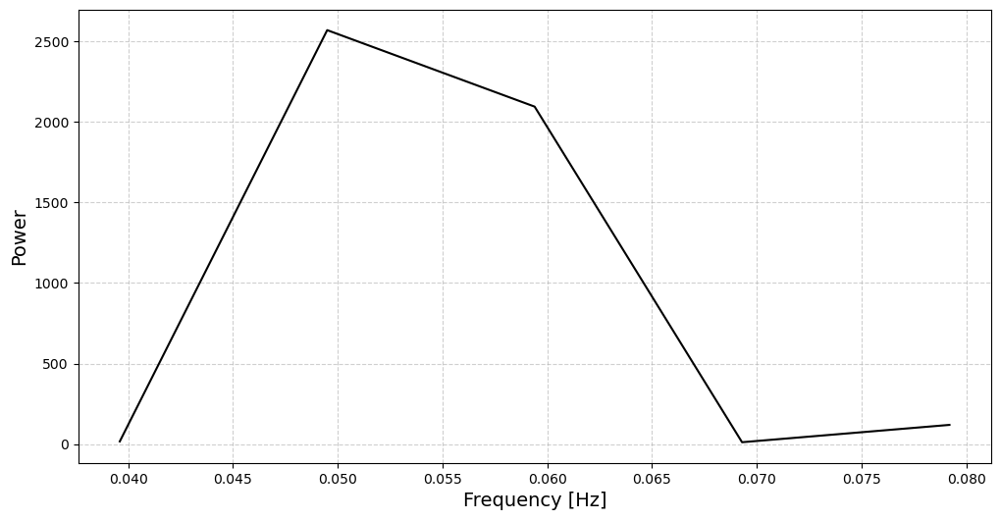

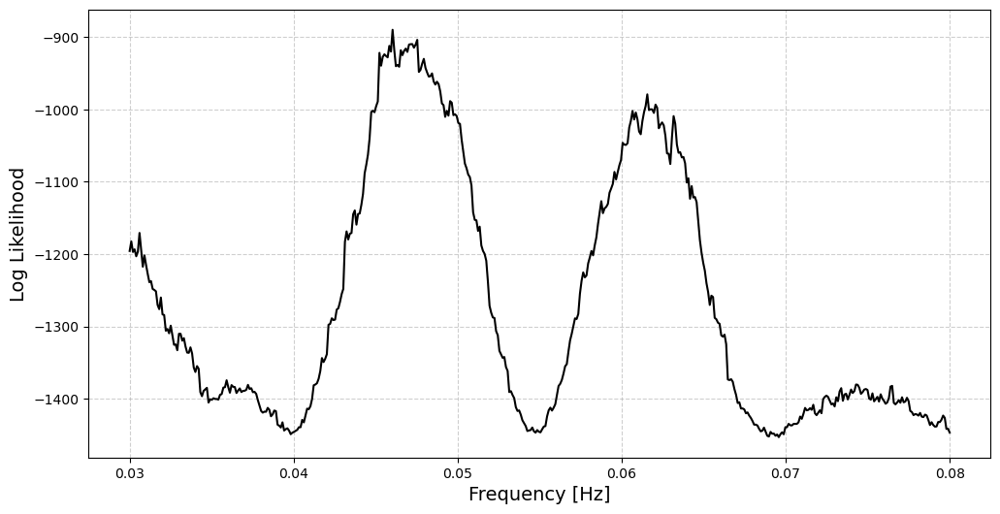

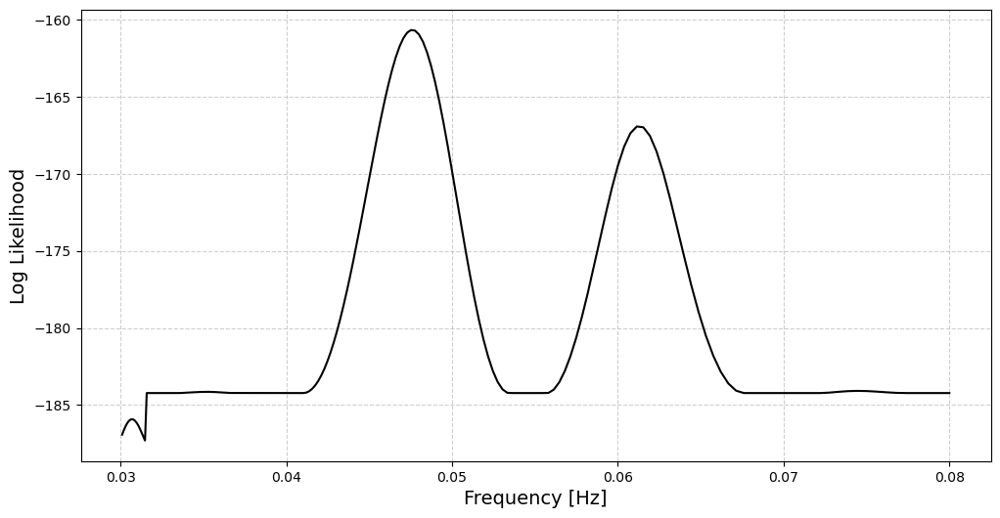

In [82]:
pc= Oscilation_Detector(generator2.data, w_min=0.03, w_max=0.08)
pc.Compute_FFT()
pc.Compute_GL()
pc.Compute_GP()
pc.Plot_FFT()
pc.Plot_GL()
pc.Plot_GP()

# phase dependency

In [84]:
generator =SignalGenerator()
pc = Oscilation_Detector(generator.data, w_min=0.025, w_max=0.045)

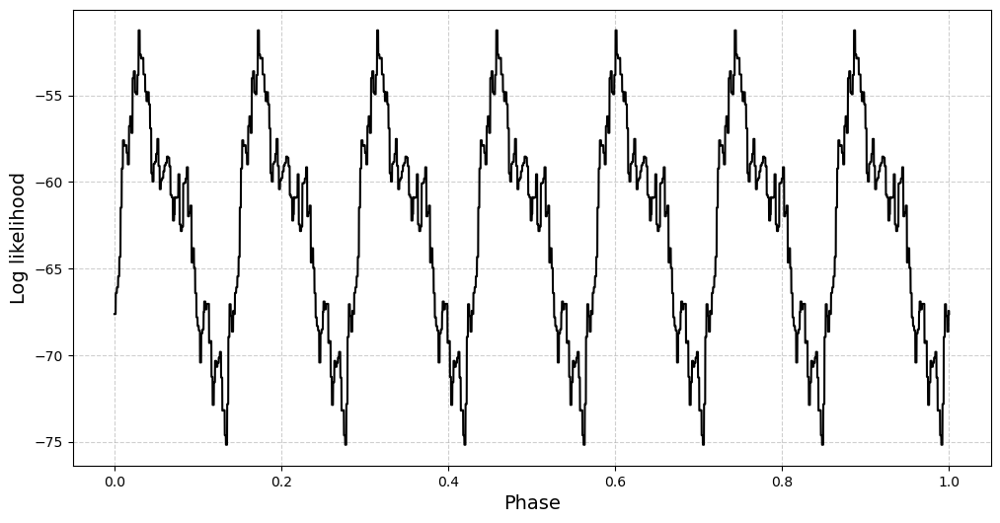

In [91]:
phi_val = np.linspace(0, 1, 10000)
prob = [np.log(pc.liklihood(0.035, c, 7)[0]) for c in phi_val]
fig = plt.figure(figsize=(12, 6))

# Plotting the data
plt.plot(phi_val, prob, color='black')

# Adding labels and title
plt.title('', fontsize=16, color='black')
plt.xlabel('Phase', fontsize=14, color='black')
plt.ylabel('Log likelihood', fontsize=14, color='black')

# Hiding the axis numbers
#plt.xticks([])
#plt.yticks([])

# Optional: Adding a grid for better readability
plt.grid(True, linestyle='--', alpha=0.6)

plt.show()

# Phi and w high zoom

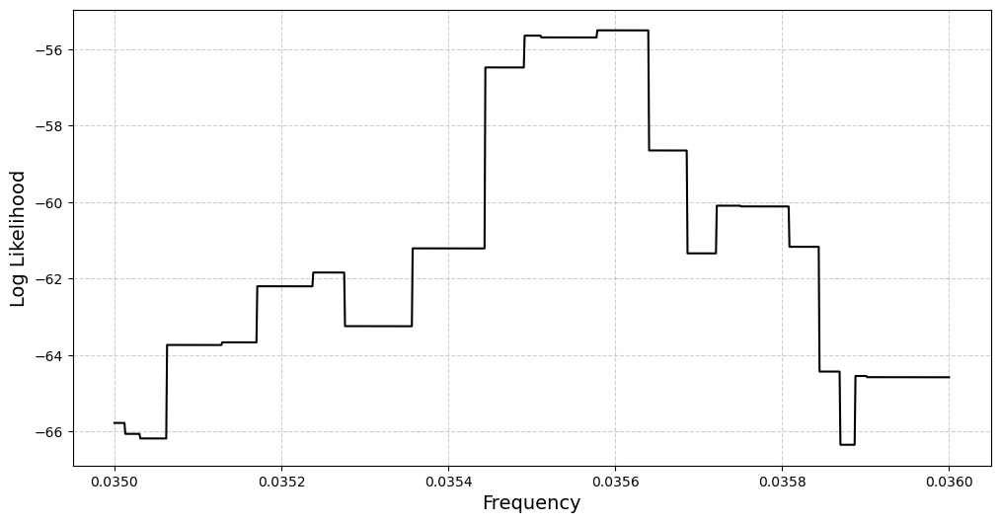

In [94]:
w_val = np.linspace(0.035, 0.036, 1000)
prob = [np.log(pc.liklihood(w, 0.1, 5)[0]) for w in w_val]

fig = plt.figure(figsize=(12, 6))

# Plotting the data
plt.plot(w_val, prob, color='black')

# Adding labels and title
plt.title('', fontsize=16, color='black')
plt.xlabel('Frequency', fontsize=14, color='black')
plt.ylabel('Log Likelihood', fontsize=14, color='black')

# Hiding the axis numbers
#plt.xticks([])
#plt.yticks([])

# Optional: Adding a grid for better readability
plt.grid(True, linestyle='--', alpha=0.6)

plt.show()

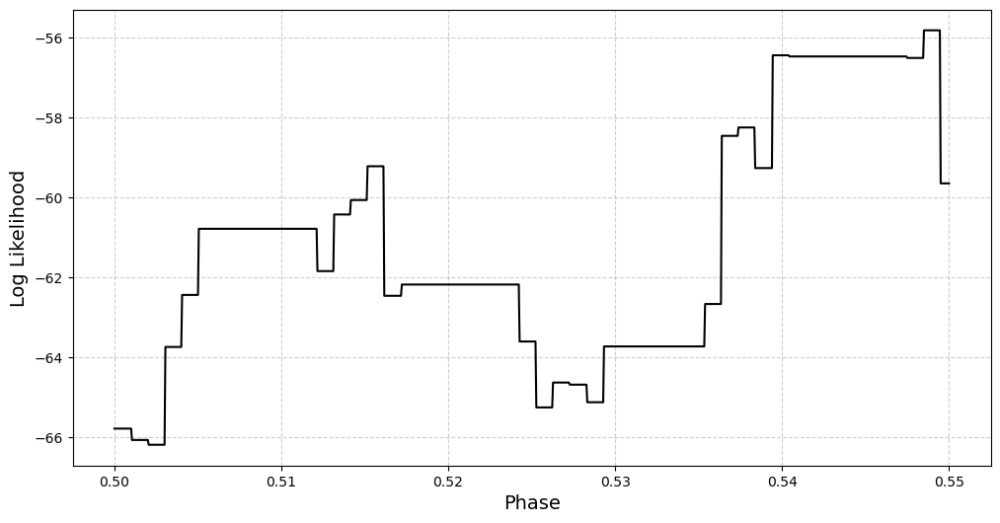

In [96]:
phi_val = np.linspace(0.5, 0.55, 1000)
prob2 = [np.log(pc.liklihood(0.035, c, 5)[0]) for c in phi_val]
fig = plt.figure(figsize=(12, 6))

# Plotting the data
plt.plot(phi_val, prob2, color='black')

# Adding labels and title
plt.title('', fontsize=16, color='black')
plt.xlabel('Phase', fontsize=14, color='black')
plt.ylabel('Log Likelihood', fontsize=14, color='black')

# Hiding the axis numbers
#plt.xticks([])
#plt.yticks([])

# Optional: Adding a grid for better readability
plt.grid(True, linestyle='--', alpha=0.6)

plt.show()

# Half Frequency anomly

C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:72: RuntimeWarning: invalid value encountered in double_scalars
  return np.sum((self.data[j_indices, 1] ** 2) / (self.data[j_indices, 2] ** 2)) / self.wj(j_indices, w, phi)
C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:69: RuntimeWarning: invalid value encountered in double_scalars
  return np.sum(self.data[j_indices, 1] / (self.data[j_indices, 2] ** 2)) / self.wj(j_indices, w, phi)
C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:38: RuntimeWarning: divide by zero encountered in double_scalars
  (self.wj(j_values == p, w, phi)**(-1/2))*
c:\Users\balay\Anaconda3\envs\daml\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__periodicity is close to the specified lower bound 11.11111111111111. Decreasing the bound and calling fit again may find a better value.
  war

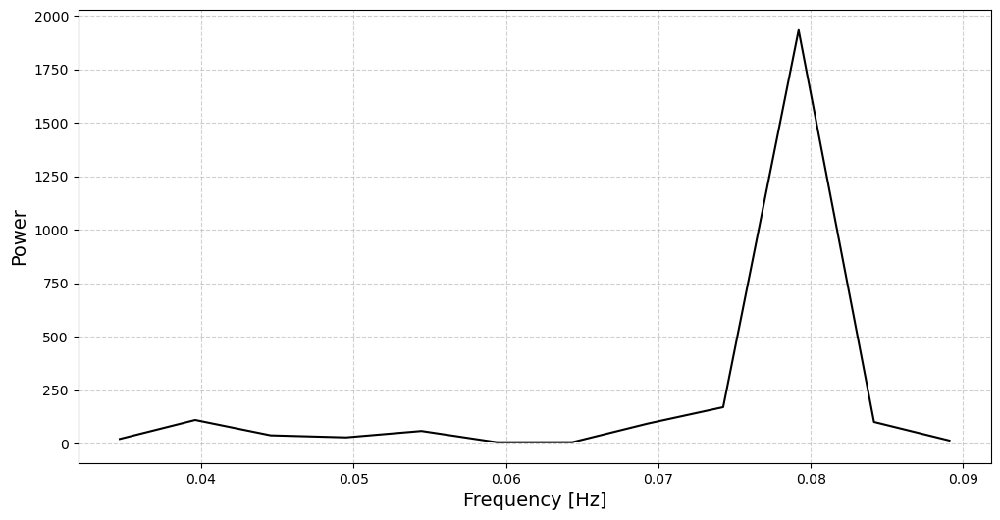

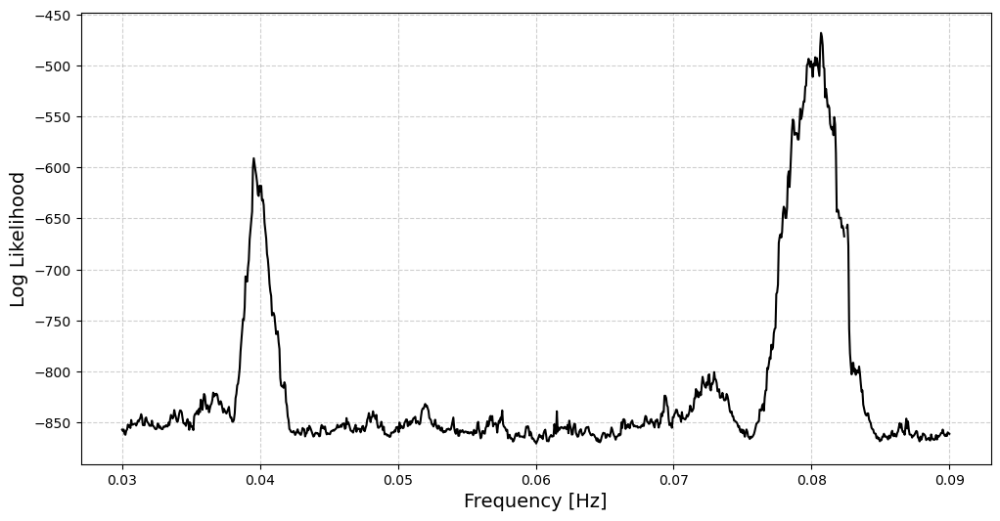

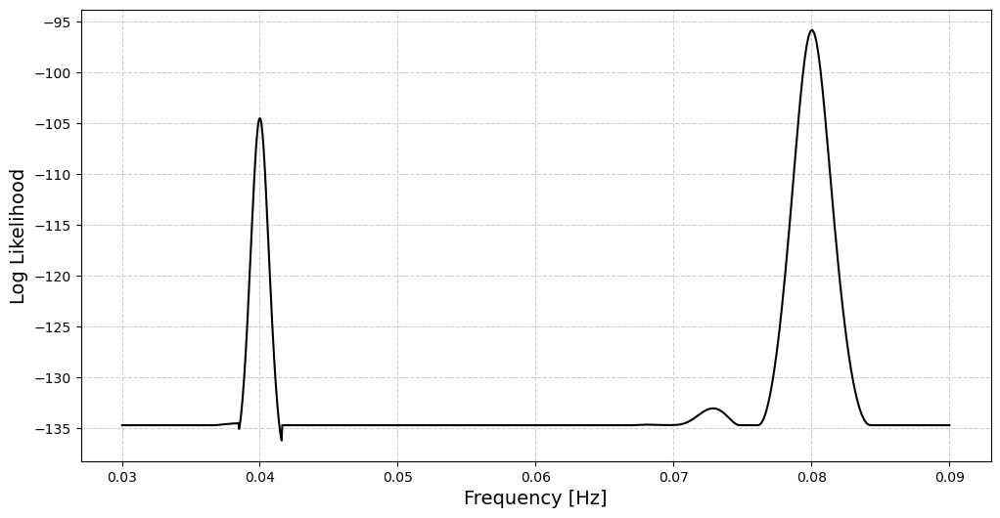

In [14]:
generator =SignalGenerator(time_range=200, frequency=0.08, noise=0.5)
pc = Oscilation_Detector(generator.data, w_min=0.03, w_max=0.09)
pc.Compute_FFT()
pc.Compute_GL(resolution=1000)
pc.Compute_GP(resolution=1000)
pc.Plot_FFT()
pc.Plot_GL()
pc.Plot_GP()

C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:72: RuntimeWarning: invalid value encountered in double_scalars
  return np.sum((self.data[j_indices, 1] ** 2) / (self.data[j_indices, 2] ** 2)) / self.wj(j_indices, w, phi)
C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:69: RuntimeWarning: invalid value encountered in double_scalars
  return np.sum(self.data[j_indices, 1] / (self.data[j_indices, 2] ** 2)) / self.wj(j_indices, w, phi)
C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:38: RuntimeWarning: divide by zero encountered in double_scalars
  (self.wj(j_values == p, w, phi)**(-1/2))*
c:\Users\balay\Anaconda3\envs\daml\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__periodicity is close to the specified lower bound 11.11111111111111. Decreasing the bound and calling fit again may find a better value.
  war

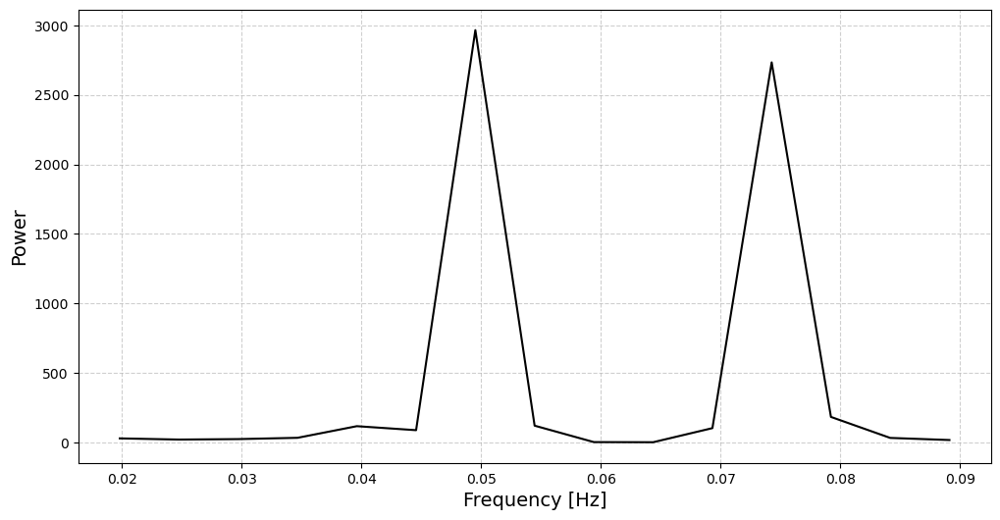

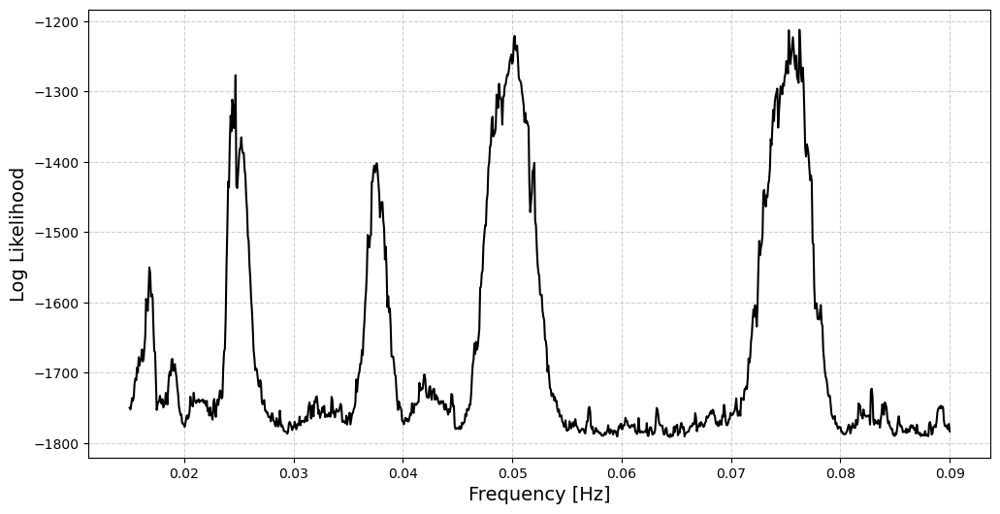

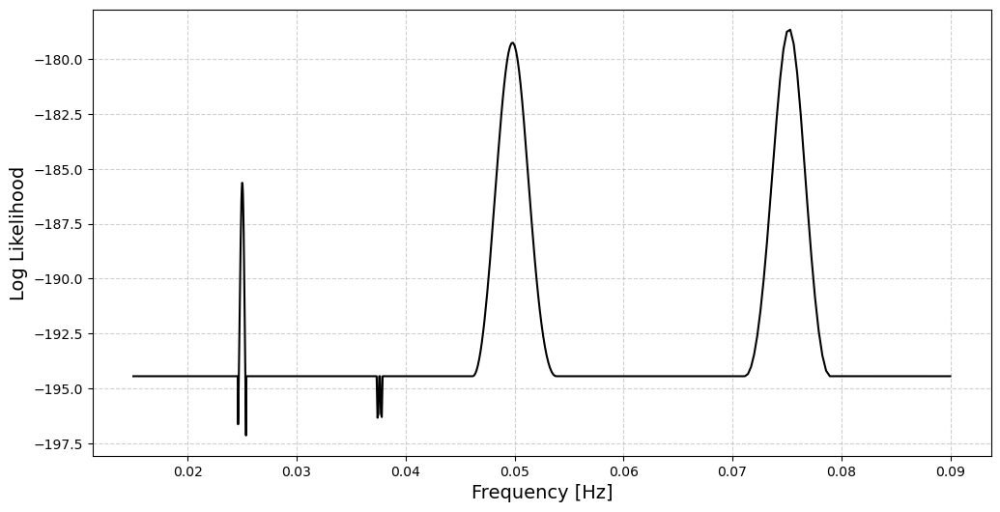

In [9]:
generator1 = SignalGenerator(time_range=200, frequency=0.075, noise=0.5)
generator2 = SignalGenerator(time_range=200, frequency=0.050, noise=0)
generator1.data.T[1] = generator1.data.T[1] + generator2.data.T[1]
pc = Oscilation_Detector(generator1.data, w_min=0.015, w_max=0.09)
pc.Compute_FFT()
pc.Compute_GL(resolution=1000)
pc.Compute_GP(resolution=1000)
pc.Plot_FFT()
pc.Plot_GL()
pc.Plot_GP()

# Spectrum with noise

C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:72: RuntimeWarning: invalid value encountered in double_scalars
  return np.sum((self.data[j_indices, 1] ** 2) / (self.data[j_indices, 2] ** 2)) / self.wj(j_indices, w, phi)
C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:69: RuntimeWarning: invalid value encountered in double_scalars
  return np.sum(self.data[j_indices, 1] / (self.data[j_indices, 2] ** 2)) / self.wj(j_indices, w, phi)
C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:38: RuntimeWarning: divide by zero encountered in double_scalars
  (self.wj(j_values == p, w, phi)**(-1/2))*
c:\Users\balay\Anaconda3\envs\daml\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__periodicity is close to the specified lower bound 11.11111111111111. Decreasing the bound and calling fit again may find a better value.
  war

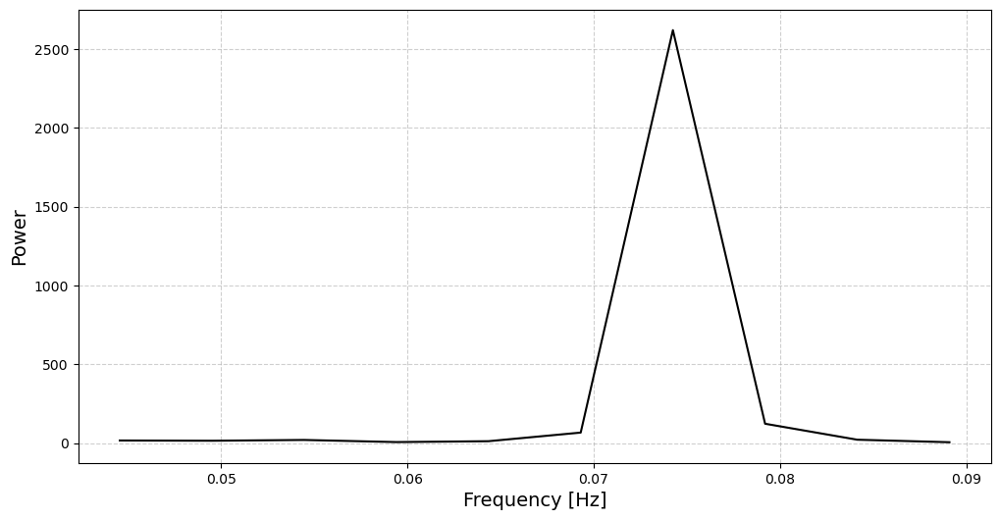

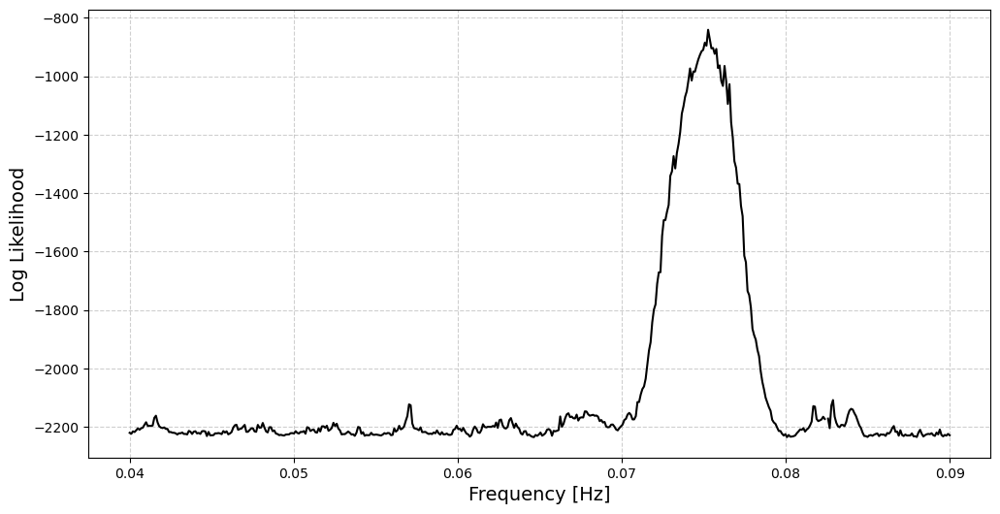

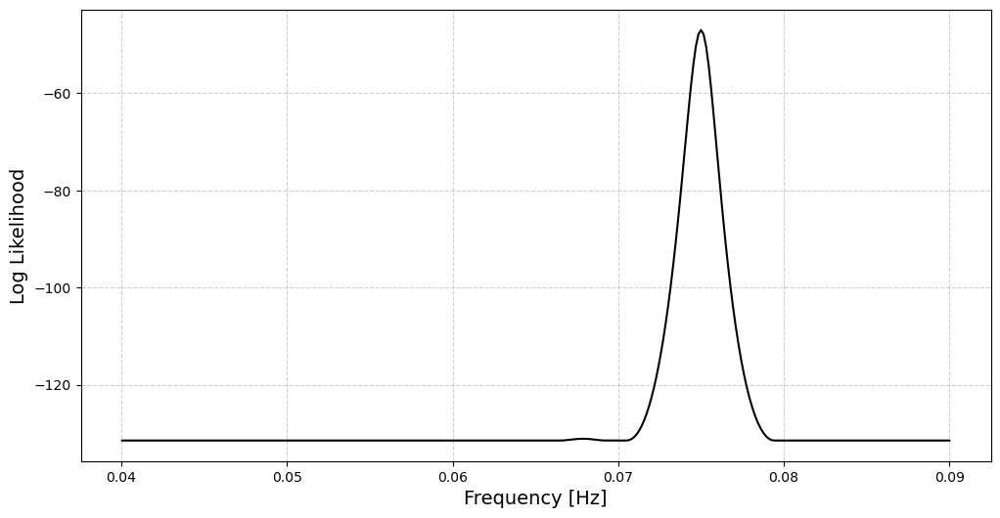

C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:72: RuntimeWarning: invalid value encountered in double_scalars
  return np.sum((self.data[j_indices, 1] ** 2) / (self.data[j_indices, 2] ** 2)) / self.wj(j_indices, w, phi)
C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:69: RuntimeWarning: invalid value encountered in double_scalars
  return np.sum(self.data[j_indices, 1] / (self.data[j_indices, 2] ** 2)) / self.wj(j_indices, w, phi)
C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:38: RuntimeWarning: divide by zero encountered in double_scalars
  (self.wj(j_values == p, w, phi)**(-1/2))*
c:\Users\balay\Anaconda3\envs\daml\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__periodicity is close to the specified upper bound 11.11211111111111. Increasing the bound and calling fit again may find a better value.
  war

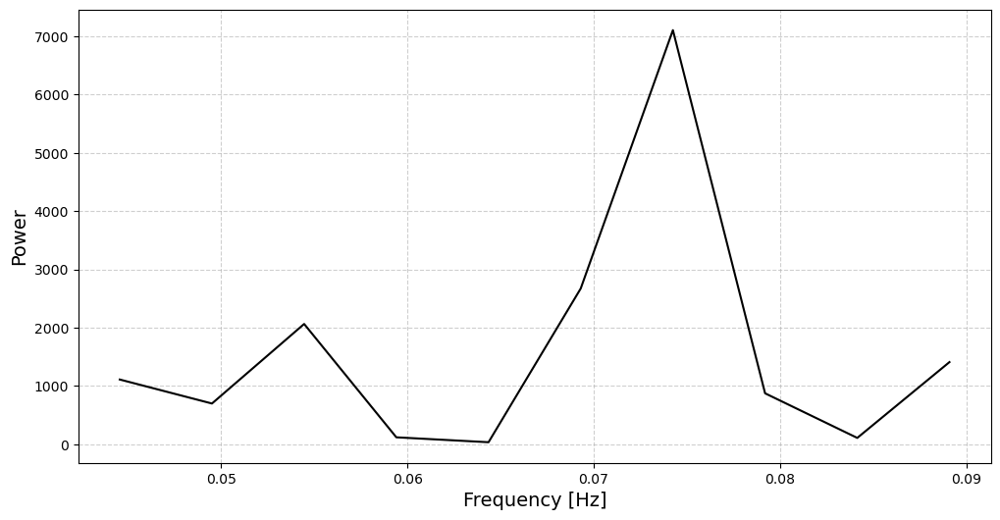

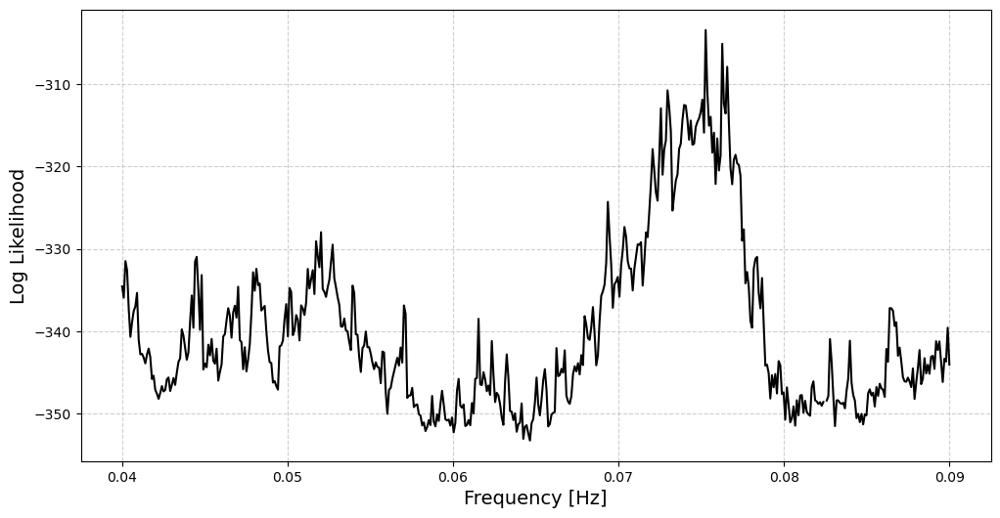

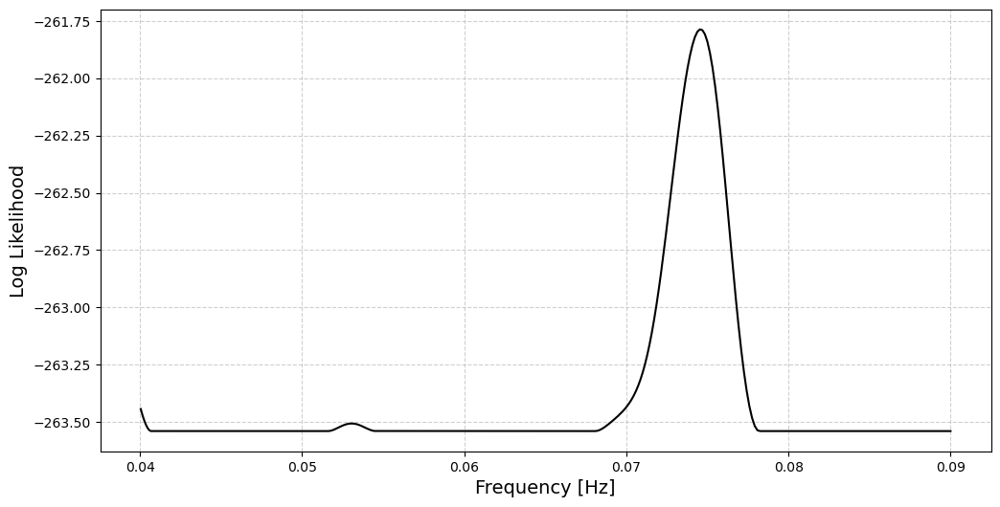

C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:72: RuntimeWarning: invalid value encountered in double_scalars
  return np.sum((self.data[j_indices, 1] ** 2) / (self.data[j_indices, 2] ** 2)) / self.wj(j_indices, w, phi)
C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:69: RuntimeWarning: invalid value encountered in double_scalars
  return np.sum(self.data[j_indices, 1] / (self.data[j_indices, 2] ** 2)) / self.wj(j_indices, w, phi)
C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:38: RuntimeWarning: divide by zero encountered in double_scalars
  (self.wj(j_values == p, w, phi)**(-1/2))*
c:\Users\balay\Anaconda3\envs\daml\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__periodicity is close to the specified upper bound 11.11211111111111. Increasing the bound and calling fit again may find a better value.
  war

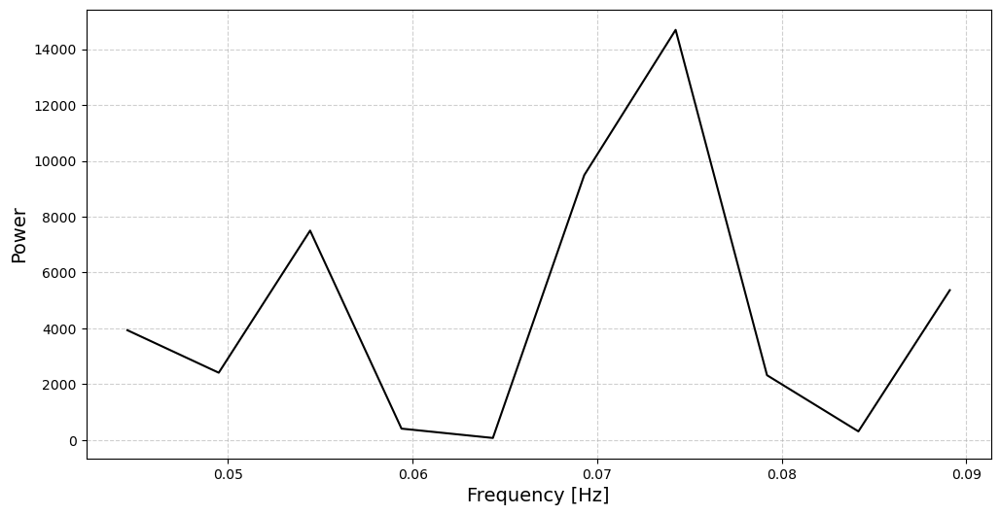

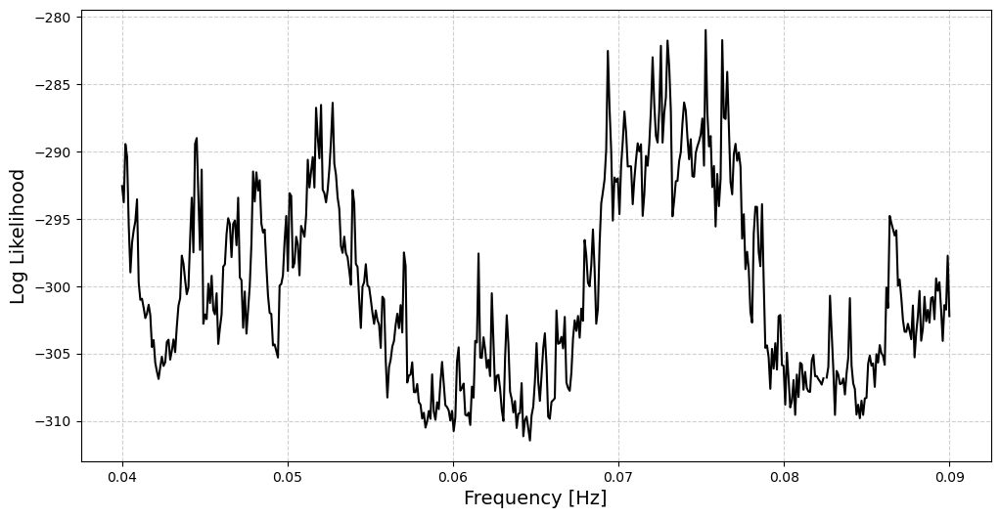

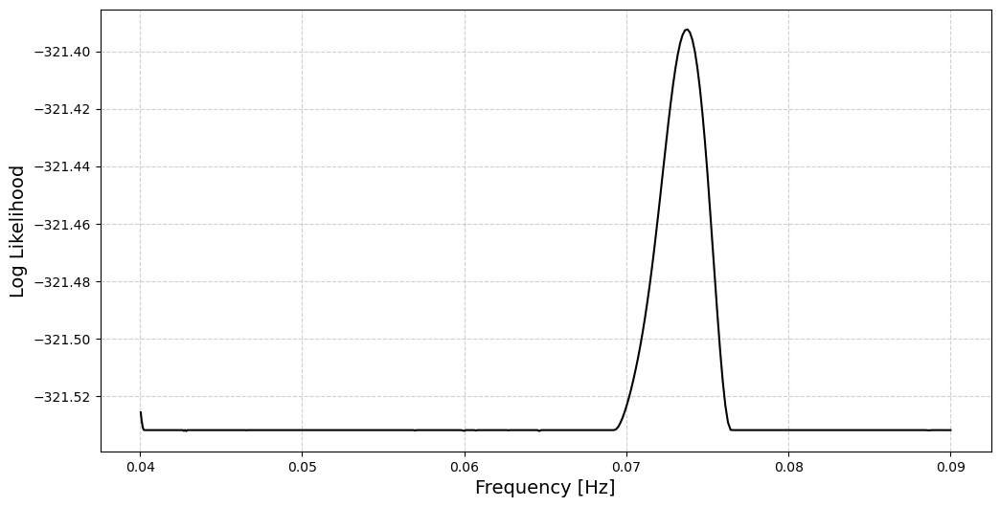

C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:72: RuntimeWarning: invalid value encountered in double_scalars
  return np.sum((self.data[j_indices, 1] ** 2) / (self.data[j_indices, 2] ** 2)) / self.wj(j_indices, w, phi)
C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:69: RuntimeWarning: invalid value encountered in double_scalars
  return np.sum(self.data[j_indices, 1] / (self.data[j_indices, 2] ** 2)) / self.wj(j_indices, w, phi)
C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:38: RuntimeWarning: divide by zero encountered in double_scalars
  (self.wj(j_values == p, w, phi)**(-1/2))*
c:\Users\balay\Anaconda3\envs\daml\lib\site-packages\sklearn\gaussian_process\kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__periodicity is close to the specified upper bound 11.11211111111111. Increasing the bound and calling fit again may find a better value.
  war

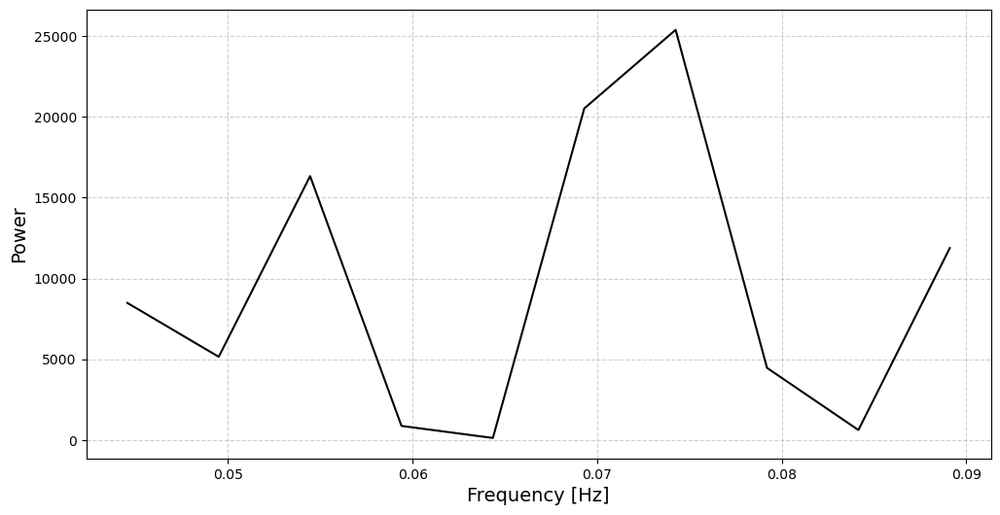

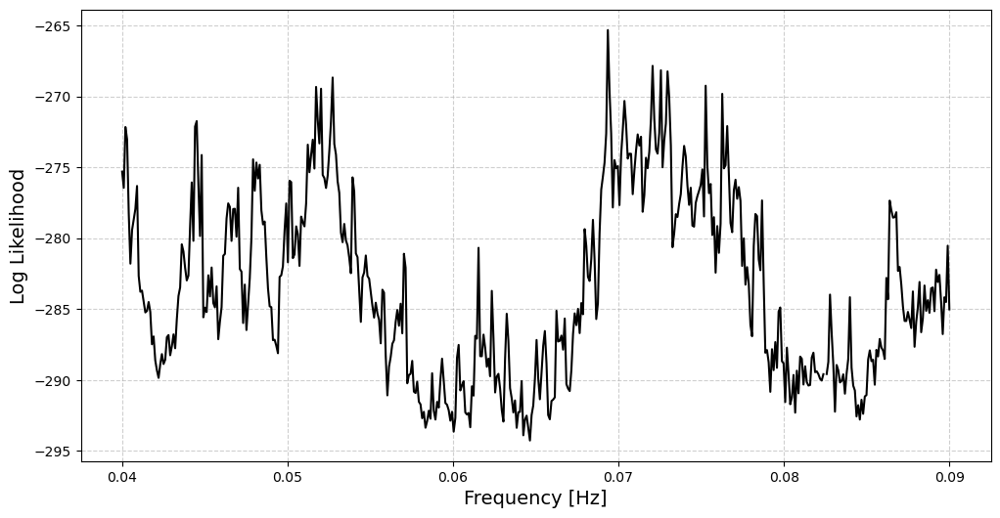

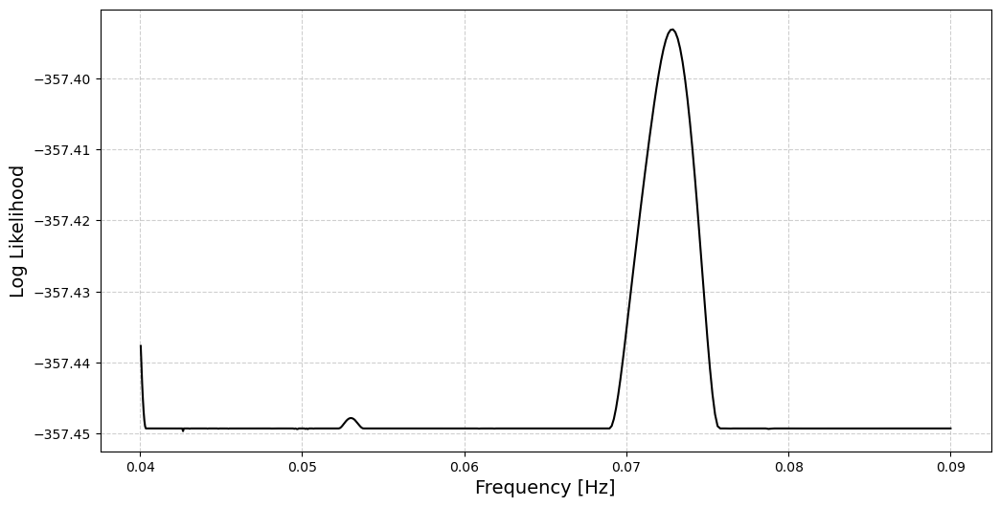

In [18]:
noise = 0.3
for i in range(4):
    generator =SignalGenerator(time_range=200, frequency=0.075, noise=noise)
    pc = Oscilation_Detector(generator.data, w_min=0.04, w_max=0.09)
    pc.Compute_FFT()
    pc.Compute_GL(resolution=500)
    pc.Compute_GP(resolution=500)
    pc.Plot_FFT()
    pc.Plot_GL()
    pc.Plot_GP()
    noise += 2.5

# Pure Noise

C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:72: RuntimeWarning: invalid value encountered in double_scalars
  return np.sum((self.data[j_indices, 1] ** 2) / (self.data[j_indices, 2] ** 2)) / self.wj(j_indices, w, phi)
C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:69: RuntimeWarning: invalid value encountered in double_scalars
  return np.sum(self.data[j_indices, 1] / (self.data[j_indices, 2] ** 2)) / self.wj(j_indices, w, phi)
C:\Users/balay/Desktop/GL_method/Gregory-lorendo-Method\Oscilation_Detector.py:38: RuntimeWarning: divide by zero encountered in double_scalars
  (self.wj(j_values == p, w, phi)**(-1/2))*
c:\Users\balay\Anaconda3\envs\daml\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__periodicity is close to the specified lower bound 1.1111111111111112. Decreasing the bound and calling fit again may find a better value.
  wa

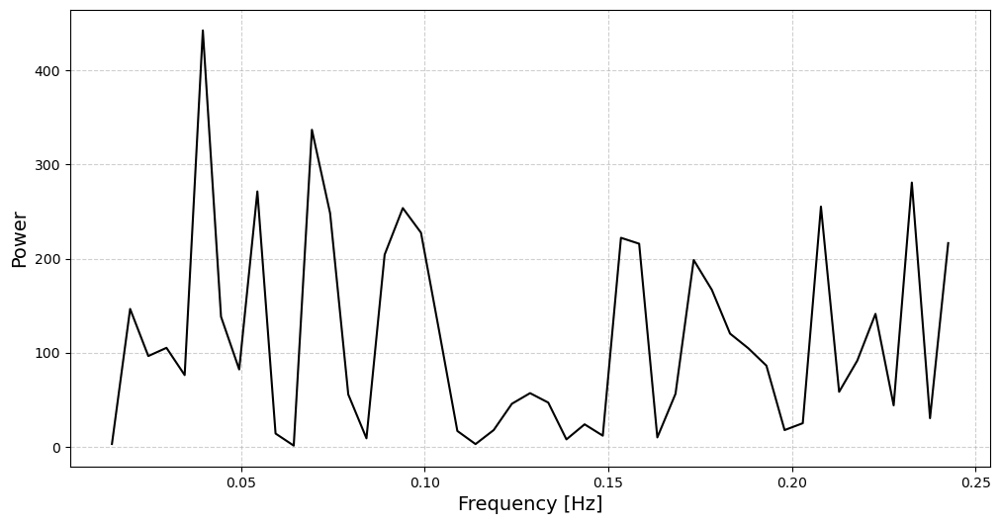

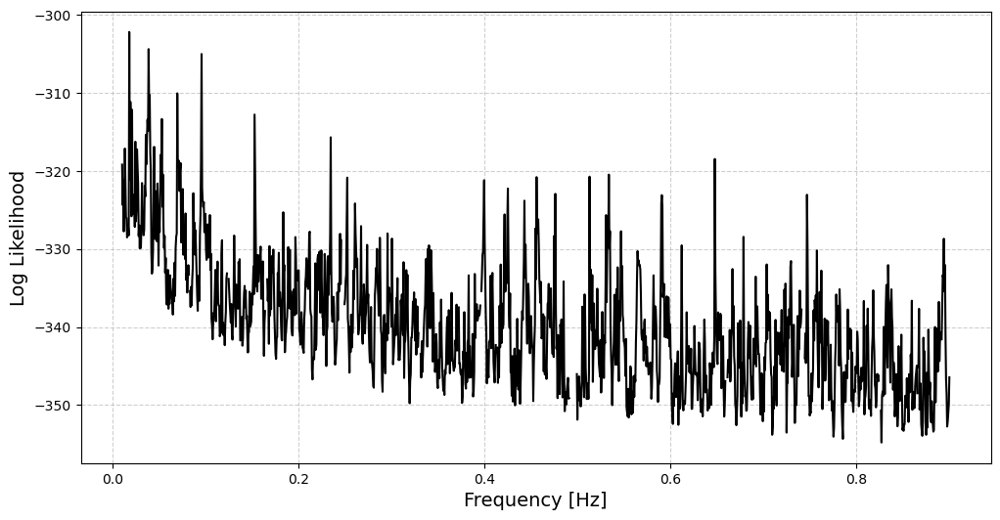

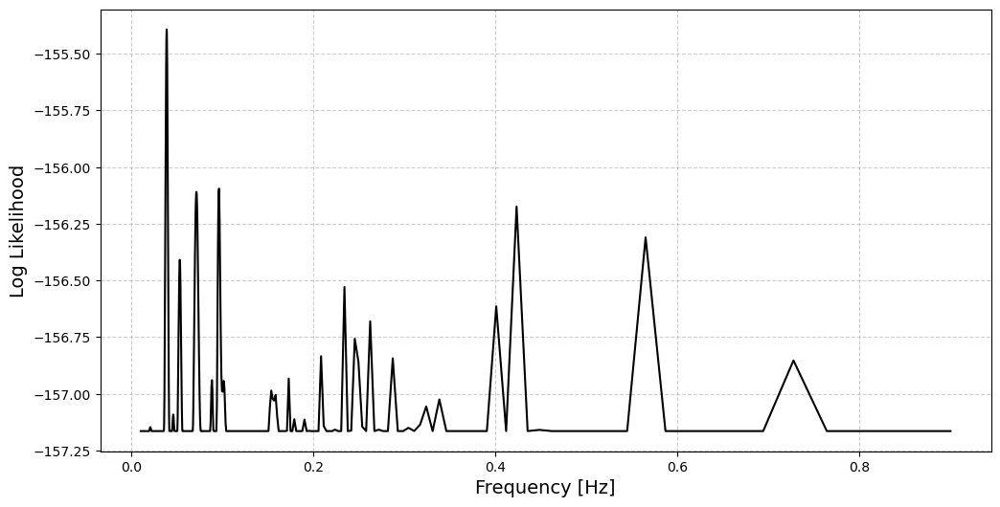

In [21]:
generator =SignalGenerator(time_range=200, frequency=0.08, noise=1, amplitude=0)
pc = Oscilation_Detector(generator.data, w_min=0.01, w_max=0.9)
pc.Compute_FFT()
pc.Compute_GL(resolution=1500)
pc.Compute_GP(resolution=1500)
pc.Plot_FFT()
pc.Plot_GL()
pc.Plot_GP()

# With Sparcity

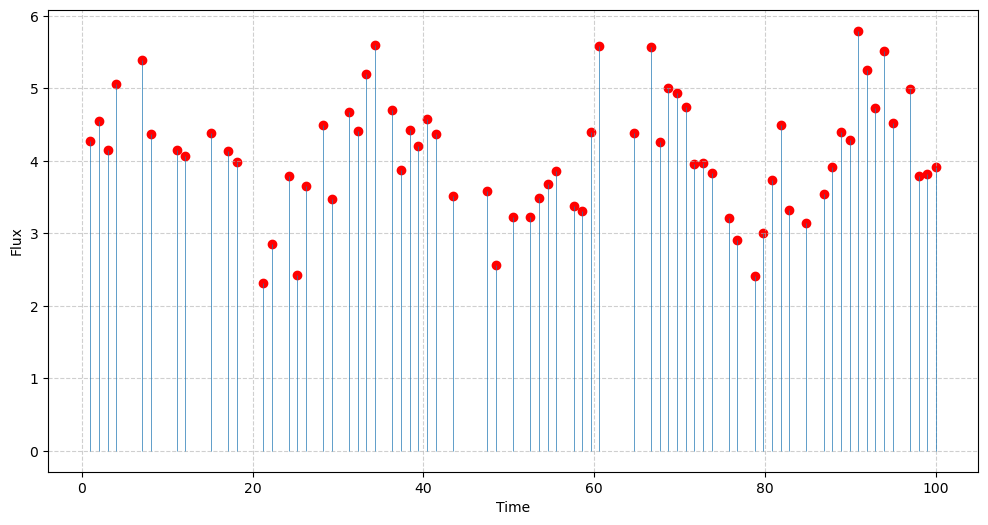

In [47]:
generator = SignalGenerator(sparcity=30)
pc = Oscilation_Detector(generator.data, w_min=0.02, w_max=0.05)
pc.plot_data()

c:\Users\balay\Anaconda3\envs\daml\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__periodicity is close to the specified lower bound 20.0. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
c:\Users\balay\Anaconda3\envs\daml\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__periodicity is close to the specified lower bound 20.15. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
c:\Users\balay\Anaconda3\envs\daml\lib\site-packages\sklearn\gaussian_process\kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__periodicity is close to the specified lower bound 20.299999999999997. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
c:\Users\balay\Anaconda3\envs\daml\lib\site-packa

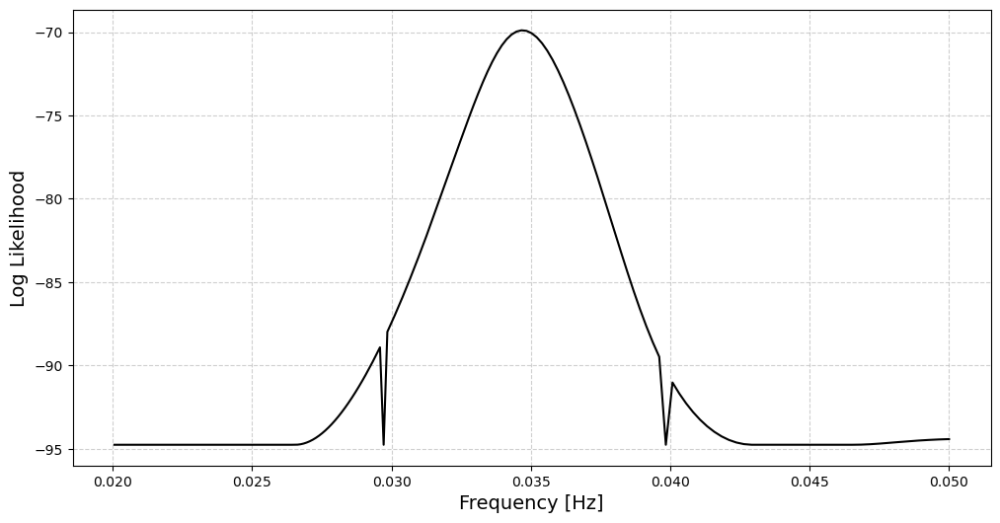

In [50]:
pc.Compute_GP()
pc.Plot_GP()

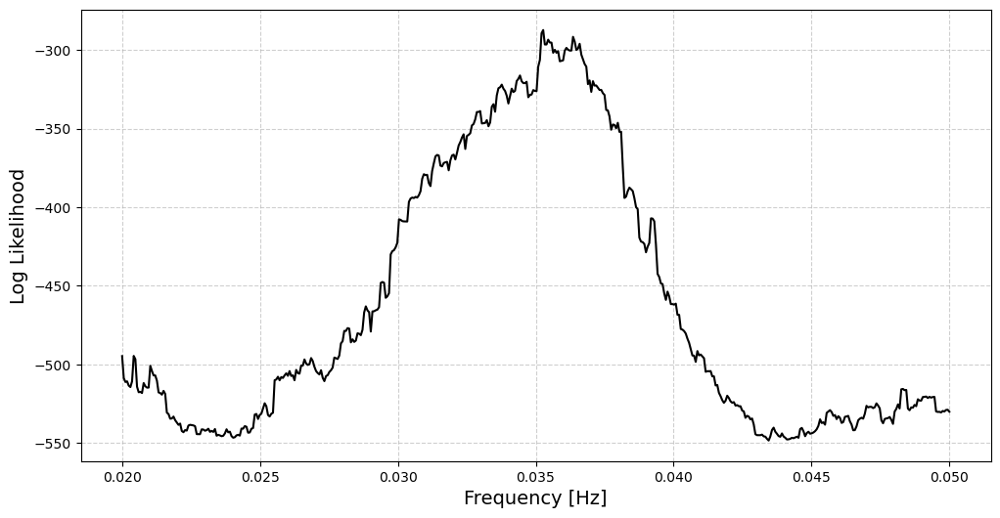

In [51]:
pc.Compute_GL()
pc.Plot_GL()

# Gaussian Prior

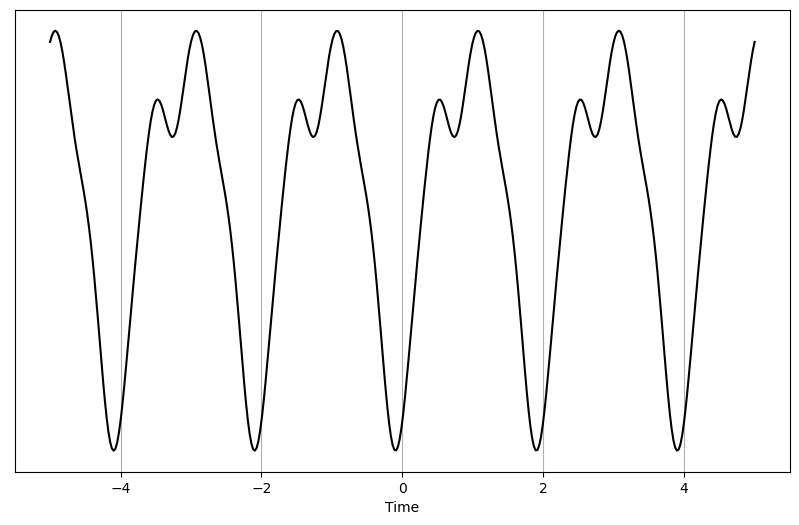

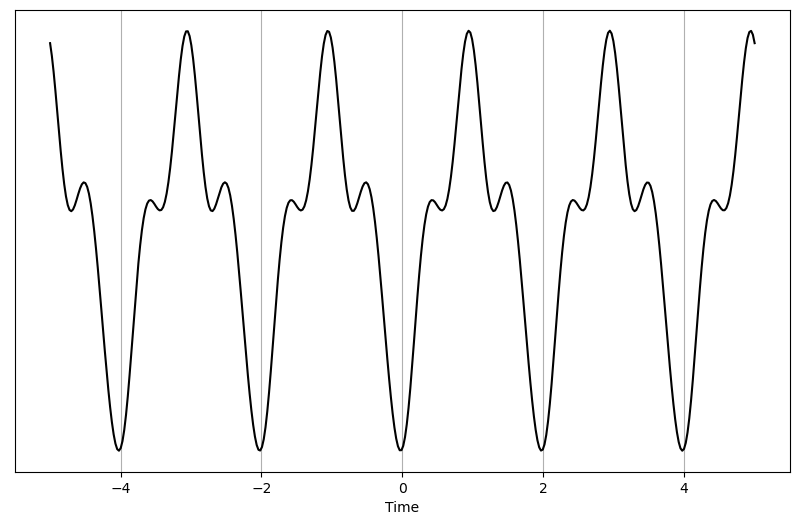

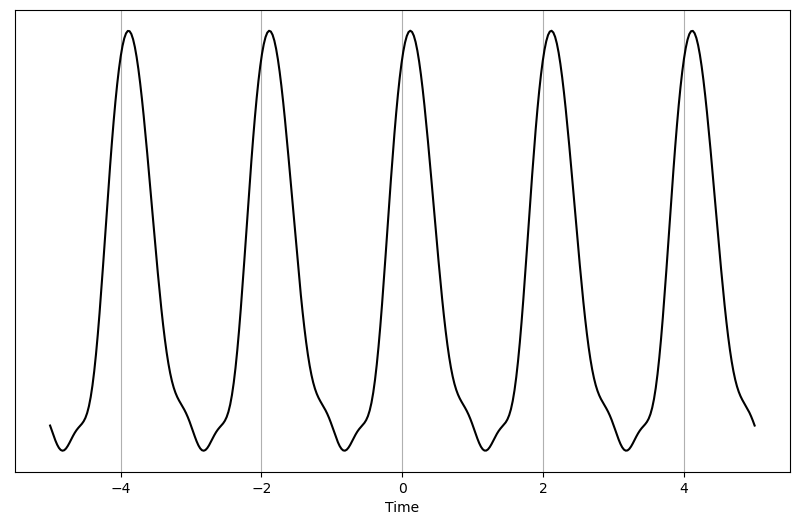

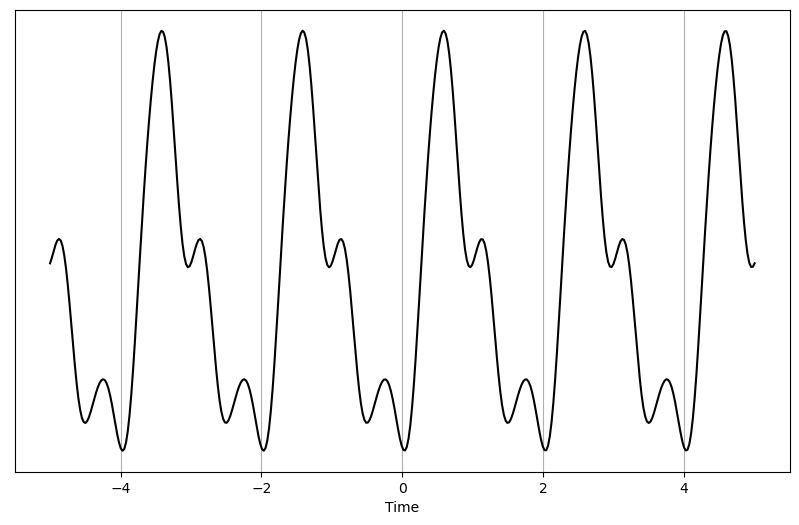

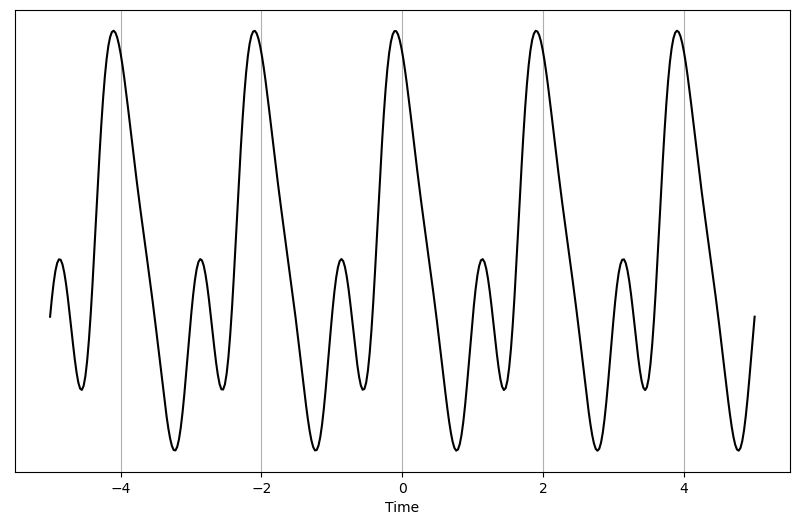

In [177]:
def periodic_kernel(x, x_prime, sigma=1.0, length_scale=1.0, period=2.0):
    return sigma**2 * np.exp(-2 * np.sin(np.pi * np.abs(x - x_prime) / period)**2 / length_scale**2)


for i in range(5):
    X = np.linspace(-5, 5, 400)
    K_periodic = np.array([[periodic_kernel(x, y) for y in X] for x in X])
    sample_periodic = np.random.multivariate_normal(np.zeros(X.shape[0]), K_periodic)  # Using X.shape[0] instead of len(X)

    plt.figure(figsize=(10, 6))
    plt.plot(X, sample_periodic, lw=1.5, color = 'black')
    plt.title("")
    plt.xlabel("Time")
    plt.ylabel("")
    plt.grid(True)
    plt.yticks([])
    plt.show()

# Gausian Minimisation

In [148]:
# Define the function
def f(x, y):
    return 0.1*np.sin(x)*np.cos(y)*np.exp(0.05*(-x))+1.5

# Create a grid of points
x = np.linspace(0, 5, 400)
y = np.linspace(0, 5, 400)
X, Y = np.meshgrid(x, y)
Z = f(X, Y)

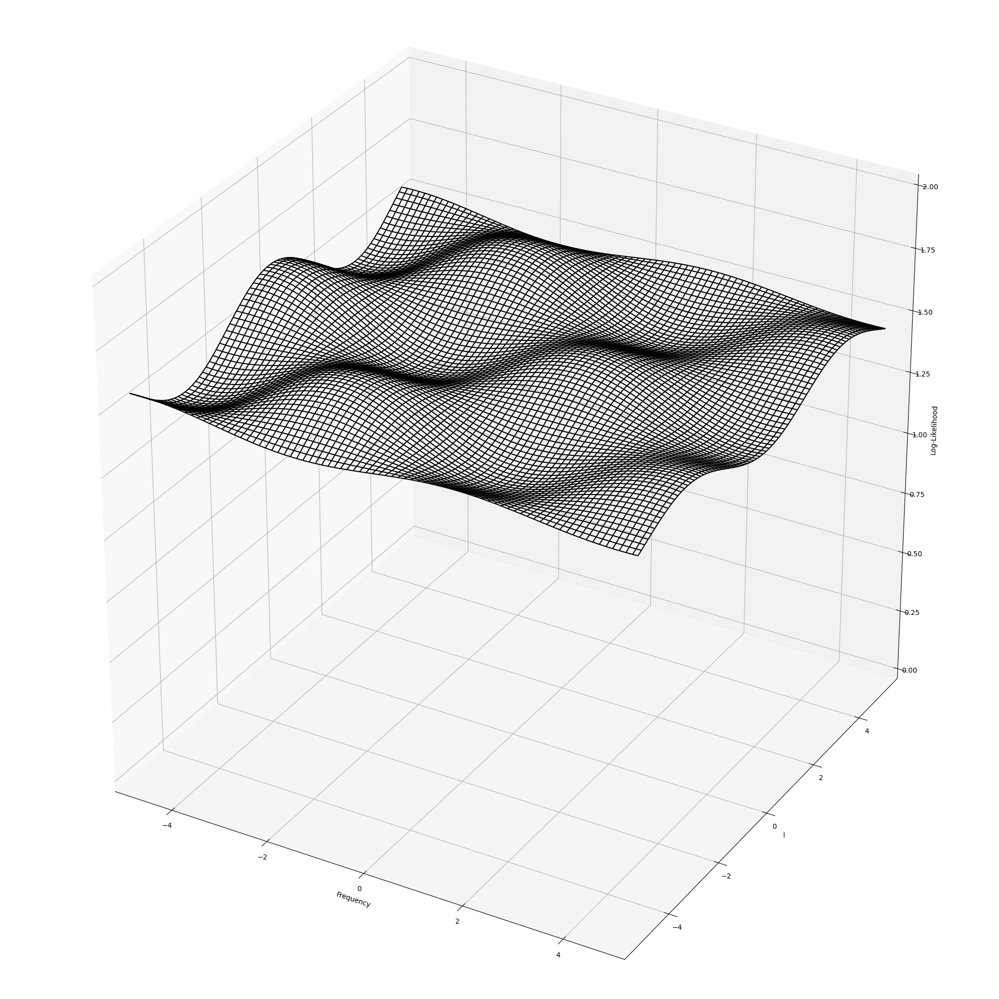

In [149]:
# Set up the figure and axis with a rectangular shape
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111, projection='3d')

# Plot the 3D wireframe

# Create a grid of points
x = np.linspace(-5, 5, 400)
y = np.linspace(-5, 5, 400)
X, Y = np.meshgrid(x, y)
Z = f(X, Y)

ax.plot_wireframe(X, Y, Z, rstride=5, cstride=5, color = 'black')

ax.set_box_aspect([1, 1, 1])  # Adjusting the aspect ratio
# Set plot limits and labels
ax.set_xlabel('Frequency')
ax.set_ylabel('I')
ax.set_zlabel('Log-Likelihood')
ax.set_xlim(-5,5)
ax.set_zlim(0,2)
ax.view_init(elev=30, azim=-60)  # Adjust the viewing angle for a better view






plt.tight_layout()
plt.show()

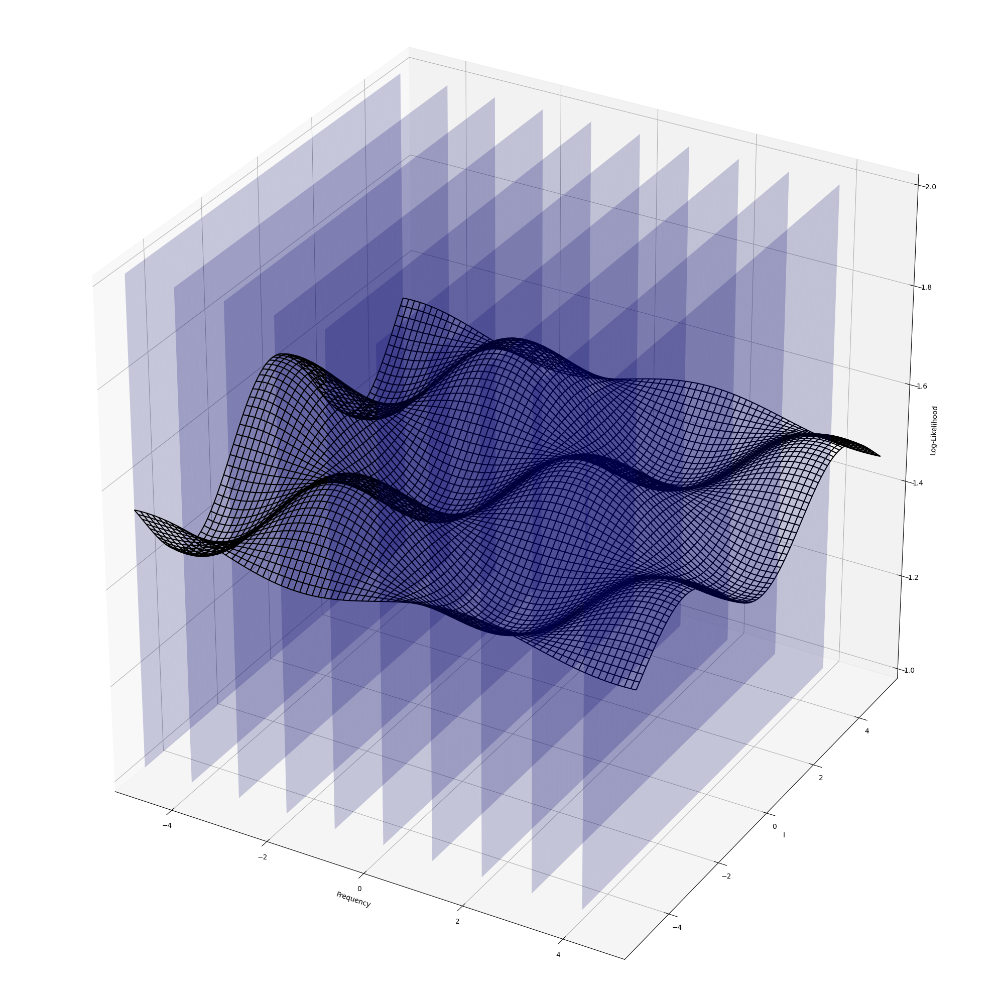

In [150]:
# Set up the figure and axis with a rectangular shape
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111, projection='3d')

# Plot the 3D wireframe

# Create a grid of points
x = np.linspace(-5, 5, 400)
y = np.linspace(-5, 5, 400)
X, Y = np.meshgrid(x, y)
Z = f(X, Y)

ax.plot_wireframe(X, Y, Z, rstride=5, cstride=5, color = 'black')

ax.set_box_aspect([1, 1, 1])  # Adjusting the aspect ratio
# Set plot limits and labels
ax.set_xlabel('Frequency')
ax.set_ylabel('I')
ax.set_zlabel('Log-Likelihood')
ax.set_xlim(-5,5)
ax.set_zlim(0,5)
ax.view_init(elev=30, azim=-60)  # Adjust the viewing angle for a better view


Z = np.linspace(1, 2, 100)
Y, Z = np.meshgrid(y, Z)
X = 2 * np.ones_like(Y) 

len = -5
for i in range(10):
    X = len* np.ones_like(Y) 
    # Plot the surface with a translucent alpha value
    ax.plot_surface(X, Y, Z, alpha=0.2, color='blue')
    len += 1







ax.set_zlim(1,2)

plt.tight_layout()
plt.show()

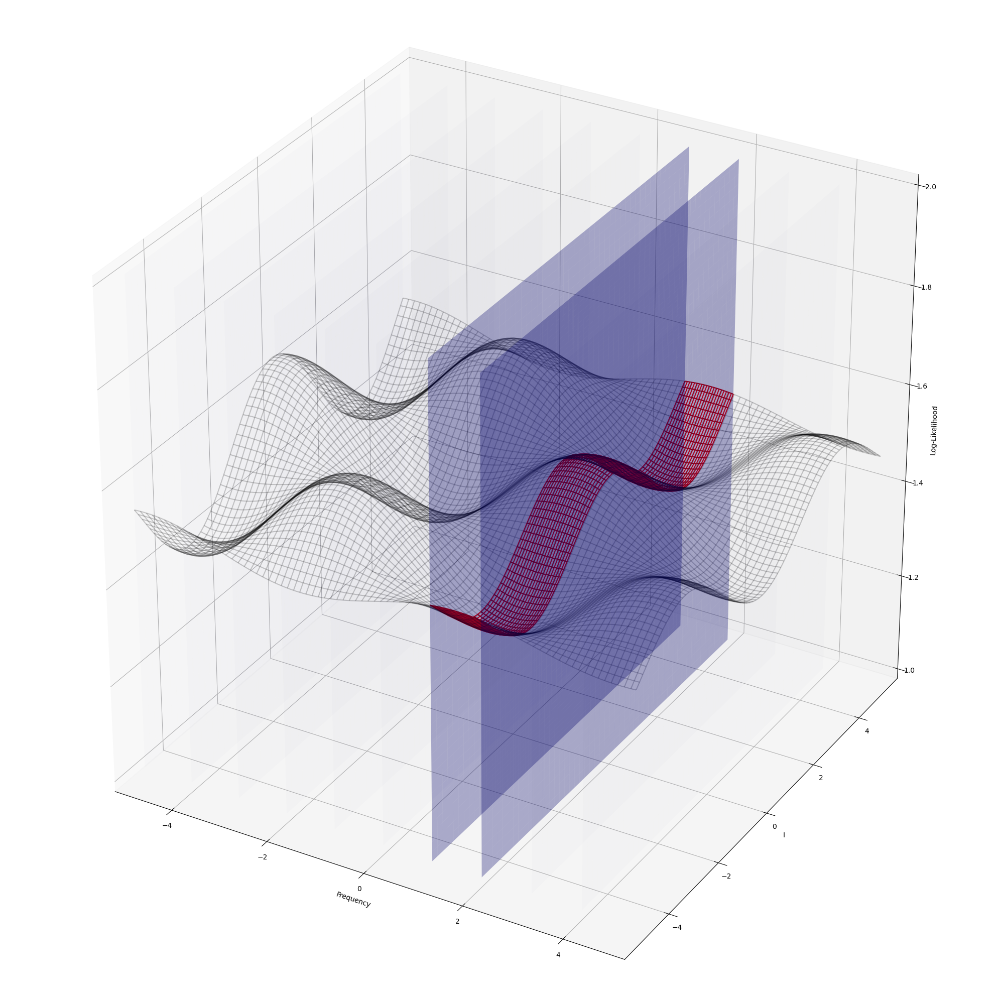

In [151]:
# Set up the figure and axis with a rectangular shape
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111, projection='3d')

# Plot the 3D wireframe

# Create a grid of points
x = np.linspace(-5, 5, 400)
y = np.linspace(-5, 5, 400)
X, Y = np.meshgrid(x, y)
Z = f(X, Y)

ax.plot_wireframe(X, Y, Z, rstride=5, cstride=5, color = 'black', alpha=0.2)

x = np.linspace(1, 2, 100)
X, Y = np.meshgrid(x, y)
Z = f(X, Y)
ax.plot_wireframe(X, Y, Z, rstride=5, cstride=5, color = 'red')

ax.set_box_aspect([1, 1, 1])  # Adjusting the aspect ratio
# Set plot limits and labels
ax.set_xlabel('Frequency')
ax.set_ylabel('I')
ax.set_zlabel('Log-Likelihood')
ax.set_xlim(-5,5)
ax.set_zlim(0,5)
ax.view_init(elev=30, azim=-60)  # Adjust the viewing angle for a better view


Z = np.linspace(1, 2, 100)
Y, Z = np.meshgrid(y, Z)
X = 2 * np.ones_like(Y) 

len = -5
for i in range(10):
    X = len* np.ones_like(Y) 
    # Plot the surface with a translucent alpha value
    ax.plot_surface(X, Y, Z, alpha=0.01, color='blue')
    len += 1

X = 1* np.ones_like(Y) 
# Plot the surface with a translucent alpha value
ax.plot_surface(X, Y, Z, alpha=0.3, color='blue')

X = 2* np.ones_like(Y) 
# Plot the surface with a translucent alpha value
ax.plot_surface(X, Y, Z, alpha=0.3, color='blue')

ax.set_zlim(1,2)

plt.tight_layout()
plt.show()

C:\Users\balay\AppData\Local\Temp\ipykernel_1736\2795153485.py:50: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


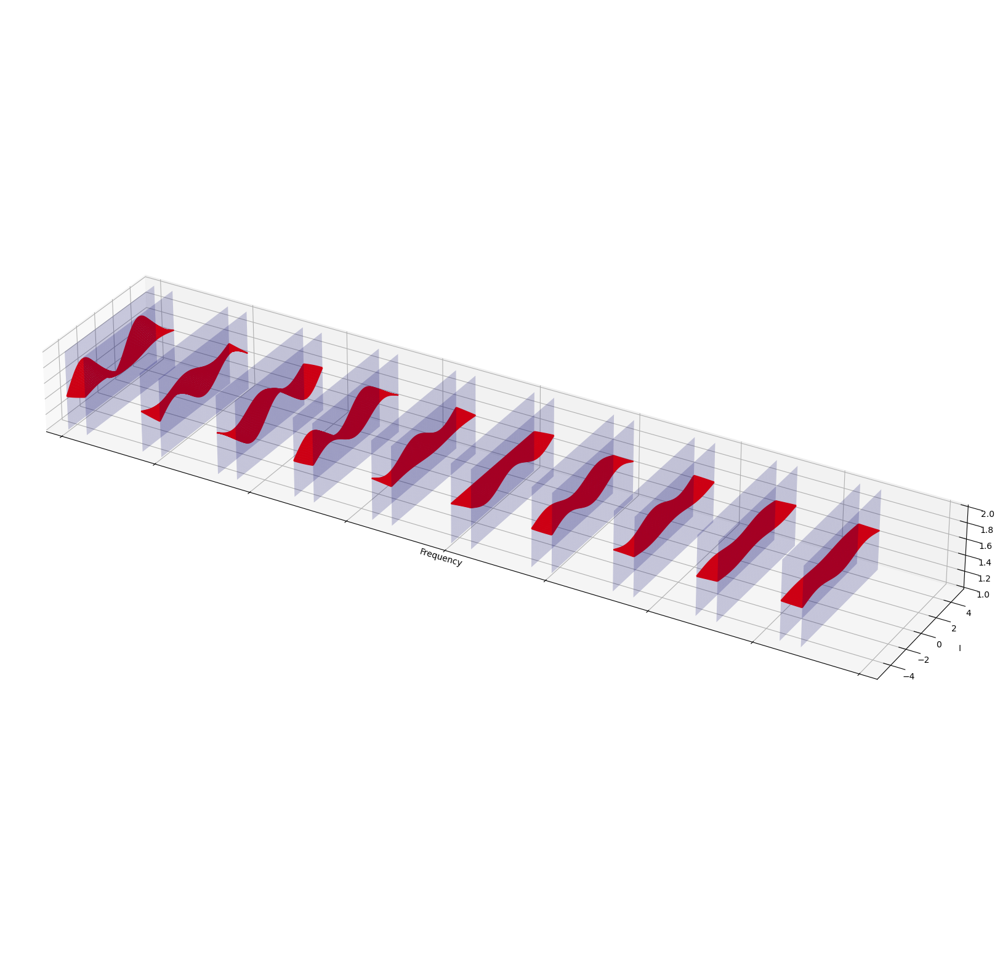

In [152]:
# Set up the figure and axis with a rectangular shape
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111, projection='3d')

# Plot the 3D wireframe



y = np.linspace(-5, 5, 400)
len = -20
for i in range(10):
    x = np.linspace(len, len+1 , 100)
    X, Y = np.meshgrid(x, y)
    Z = f(X, Y)
    ax.plot_wireframe(X, Y, Z, rstride=5, cstride=5, color = 'red')

    len += 4



ax.set_box_aspect([1, 0.2, 0.1])  # Adjusting the aspect ratio
# Set plot limits and labels
ax.set_xlabel('Frequency')
ax.set_ylabel('I')
ax.set_zlabel('Log-Likelihood')
ax.set_xlim(-5,5)

ax.view_init(elev=30, azim=-60)  # Adjust the viewing angle for a better view


Z = np.linspace(1, 2, 100)
Y, Z = np.meshgrid(y, Z)
X = 2 * np.ones_like(Y) 

len = -20
for i in range(10):
    X = len* np.ones_like(Y) 
    # Plot the surface with a translucent alpha value
    ax.plot_surface(X, Y, Z, alpha=0.2, color='blue')
    X = (len+1)* np.ones_like(Y) 
    # Plot the surface with a translucent alpha value
    ax.plot_surface(X, Y, Z, alpha=0.2, color='blue')
    len += 4


ax.set_xlim(-20,20)
ax.set_zlim(1,2)
# Hide the x-axis tick labels
ax.set_xticklabels([])
plt.tight_layout()
plt.show()